# COMP 5329 Deep Learning Assignment2

Ng Siu Lung - Yifan Wang - Yongle Li 


## Read Me

To correctly run the program, please run jupyter noteboook from top to bottom.
The input file is in the folder called "Input" and output file is in folder "Output"

1. put train.csv in the "/Input" folder
2. put test.csv in the "/Input" folder
3. put all the images files in the "/Input/data" folder

everything generated by this notebook will be in the "Output" folder

# Section1: the Image Classification Model

# Import Libraries

In [1]:
import os
import numpy as np
import torch

import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.utils import shuffle
from torch.utils.data import Dataset, DataLoader ,random_split
import pandas as pd
import os
import scipy.stats as ss
import torch.nn as nn
import torch.nn.functional as F
%matplotlib inline

# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

# Load Data and transform labels to onehot labels

In [2]:
import os
pathParent = os.path.abspath('..')
import pandas as pd
filepathtn= fr'{pathParent}/Input/train.csv'
filepathtt= fr'{pathParent}/Input/test.csv'
imageFolder= fr'{pathParent}/Input/'

df_train= pd.read_csv(filepathtn, usecols=[0,1])

#create one hot labels for the traning data
df_train_labels = df_train
for i in range(1,21):
    df_train_labels[str(i)] = 0

for i in range(len(df_train_labels)):
    labels_1row = df_train_labels['Labels'][i].split(' ')
    for label in labels_1row:
        df_train_labels[label][i] = 1
        
df_train_labels=df_train_labels.drop(columns=['Labels'])
df_train_labels

C:\Users\ANPC\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,ImageID,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,0.jpg,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1.jpg,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,2.jpg,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3.jpg,0,0,1,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
4,4.jpg,0,0,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29995.jpg,1,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
29996,29996.jpg,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29997,29997.jpg,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29998,29998.jpg,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Create customized dataloader

In [3]:
#creating our own dataloader
class MyDataset(torch.utils.data.Dataset):
    def __init__(self , df_img, img_dir , transforms=None, train=True ):

        #self.df = df_img
        self.img_dir = img_dir
        self.transforms = transforms
        self.image_dataframe=df_img
        
        self.train = train
     
    
    def __getitem__(self,idx):
        #d = self.df.iloc[idx].item()
        if torch.is_tensor(idx):
            idx = idx.tolist()
    
        img_name = self.image_dataframe.iloc[idx,0]
        image = Image.open(self.img_dir+img_name).convert("RGB")
        if self.train== True:
            label=self.image_dataframe.iloc[idx,1:]
            label = torch.tensor(label, dtype=torch.float32)

            if self.transforms is not None:
                image = self.transforms(image)
            return image,label
        
        else:
            if self.transforms is not None:
                image = self.transforms(image)
            return image            
        
  
    def __len__(self):
        return len(self.image_dataframe)

## Transforming the image Data

In [4]:
from sklearn.utils import shuffle
from torch.utils.data import Dataset, DataLoader ,random_split

batch_size=128
val_split =0.15

train_transform = transforms.Compose([
        #additional augmentation, comment out to improve runtime
        transforms.RandomRotation(10),      # rotate +/- 10 degrees
        transforms.RandomHorizontalFlip(),  # reverse 50% of images
        transforms.Resize(224),             # resize shortest side to 224 pixels
        transforms.CenterCrop(224),         # crop longest side to 224 pixels at center
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])

val_transform = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])

df = shuffle(df_train_labels)
df.reset_index(inplace=True, drop=True)
valid_no = int(len(df)*(1-val_split) )

img_dir =  fr'{pathParent}/Input/data/'

trainset = df_train_labels
trainset = MyDataset(trainset, img_dir  , transforms=train_transform)

valset = df.iloc[valid_no:,:]
valset= MyDataset(valset, img_dir , transforms=val_transform)

print(f"trainset len {len(trainset)} valset len {len(valset)}")

trainset len 30000 valset len 4500


## DataLoaders and Data Visualization

In [5]:
# define dataloader parameters
num_workers=0

# prepare data loaders
train_loader = torch.utils.data.DataLoader(trainset , shuffle=True , batch_size=batch_size)
val_loader =  torch.utils.data.DataLoader(valset , shuffle=True , batch_size=batch_size)

<Figure size 1800x288 with 0 Axes>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


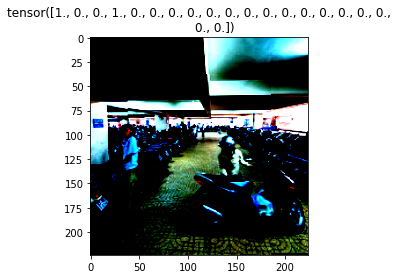

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


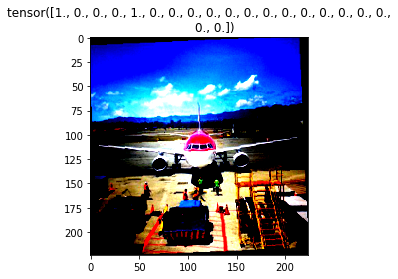

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


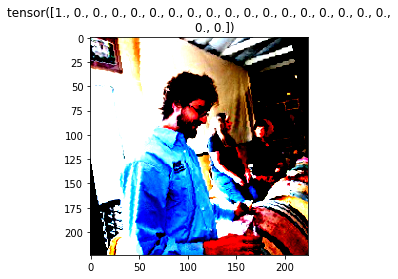

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


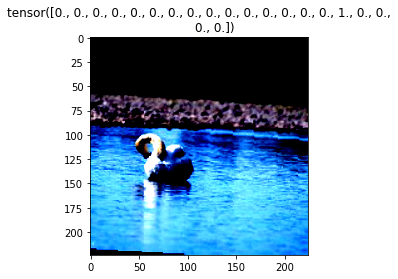

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


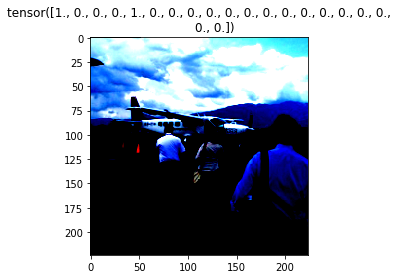

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


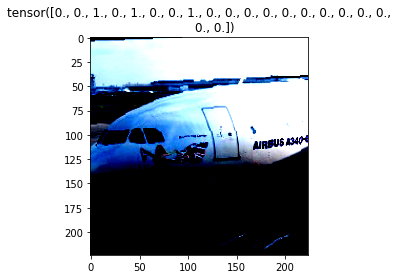

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


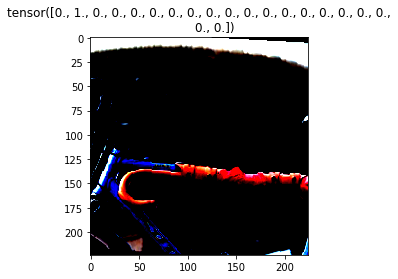

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


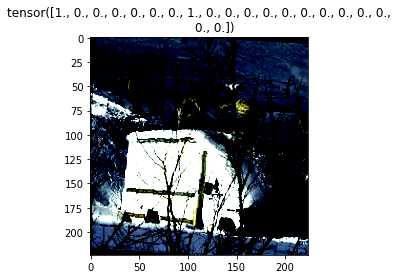

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


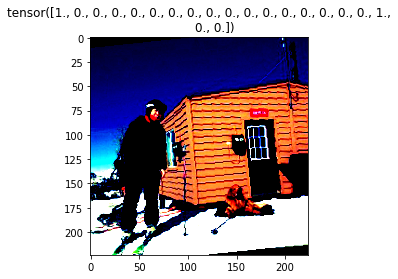

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


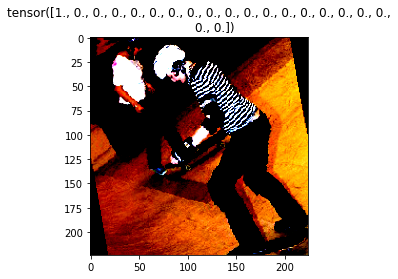

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


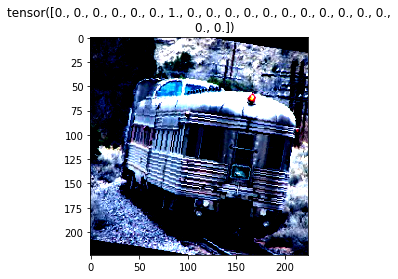

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


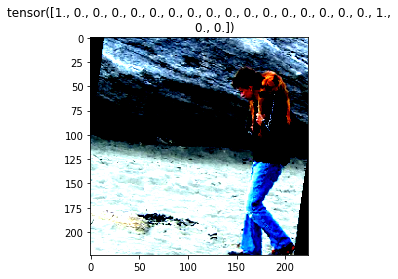

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


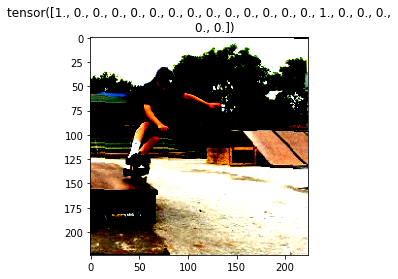

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


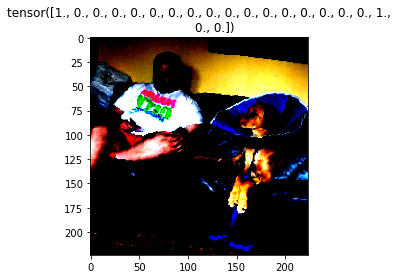

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


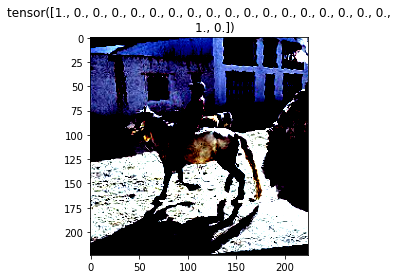

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


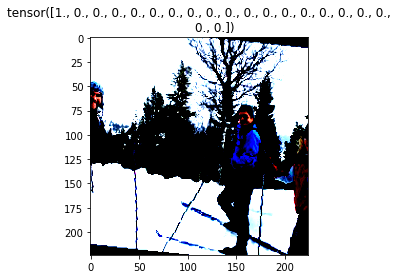

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


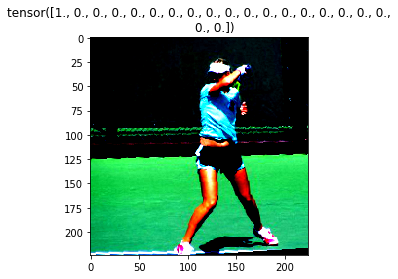

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


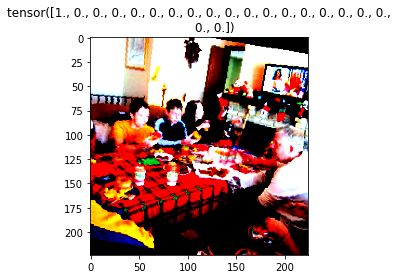

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


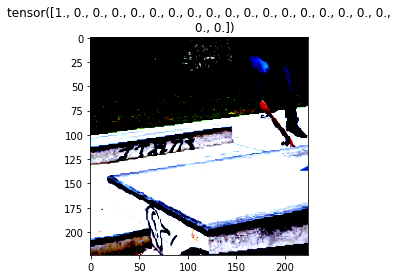

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


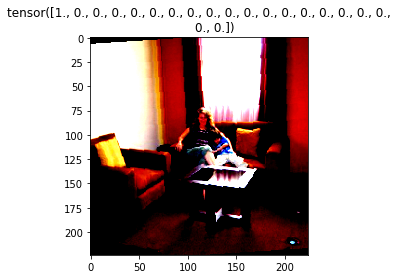

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


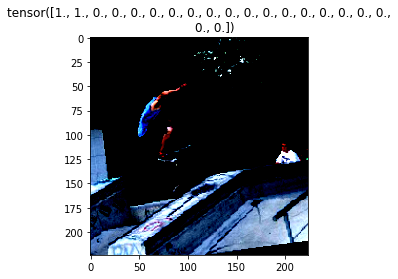

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


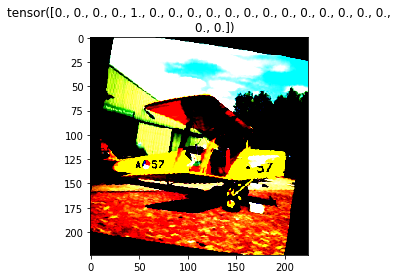

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


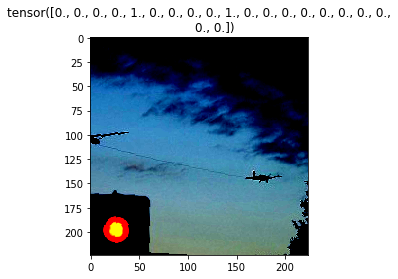

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


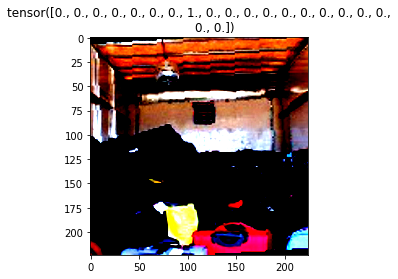

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


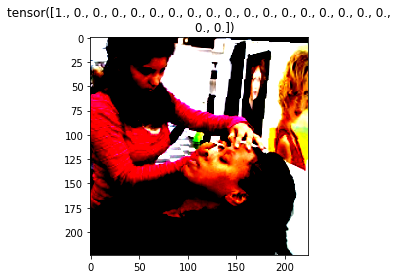

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


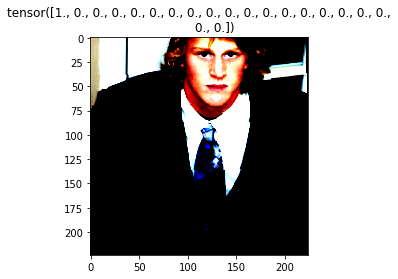

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


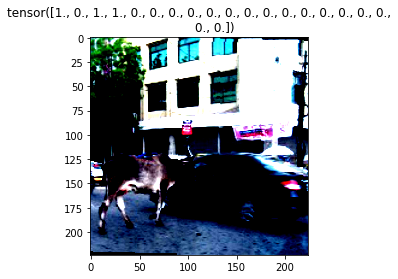

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


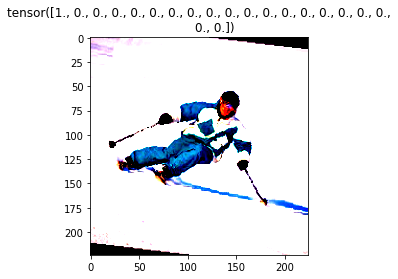

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


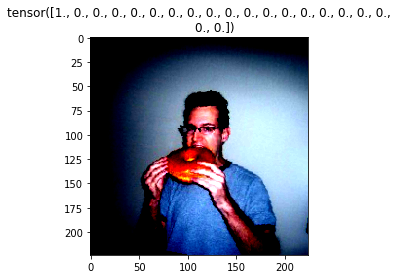

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


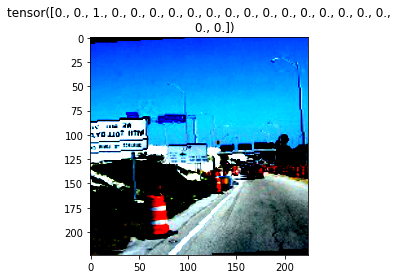

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


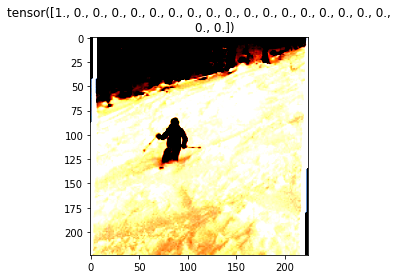

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


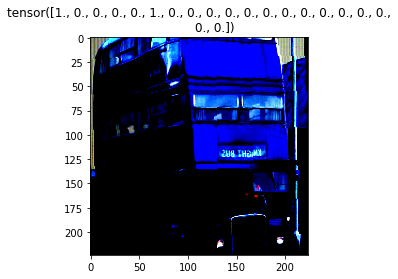

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


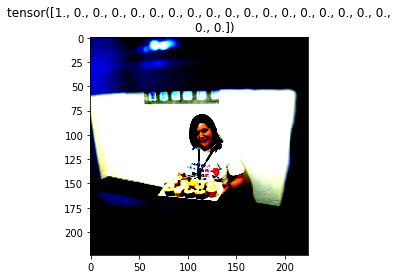

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


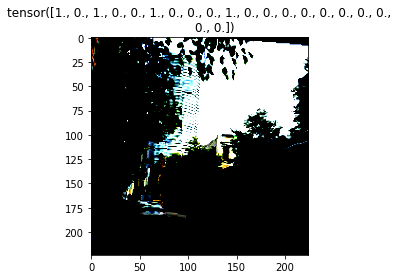

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


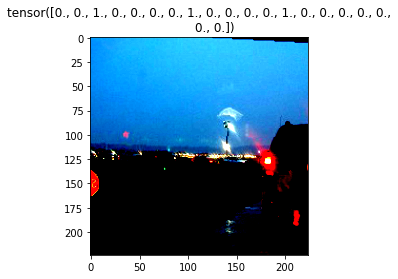

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


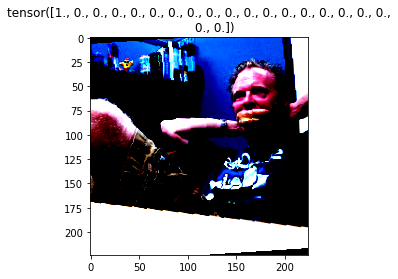

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


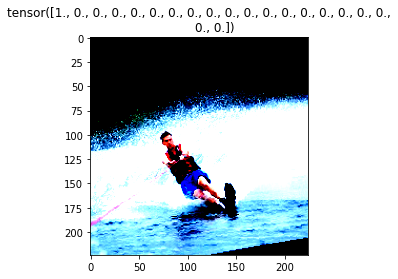

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


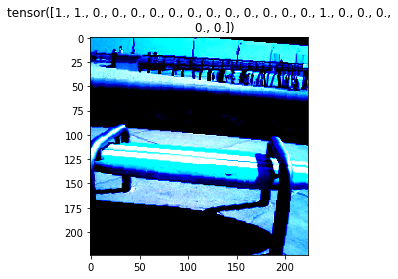

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


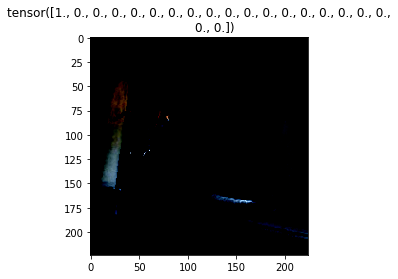

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


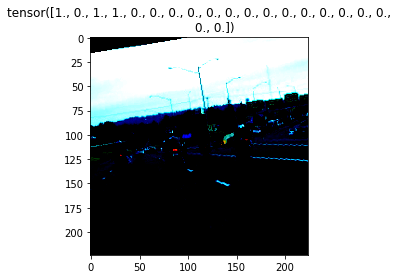

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


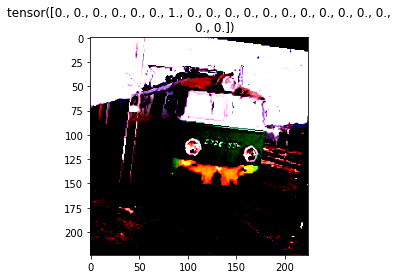

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


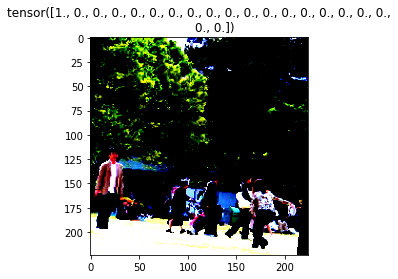

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


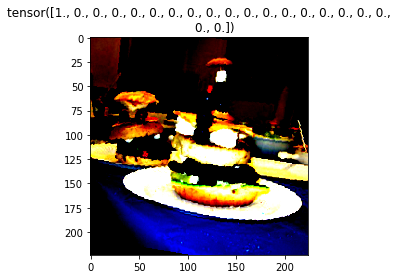

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


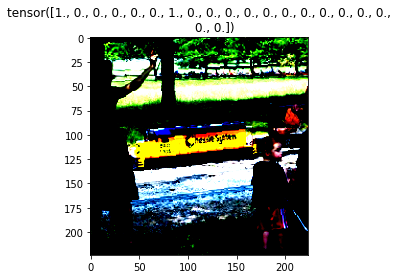

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


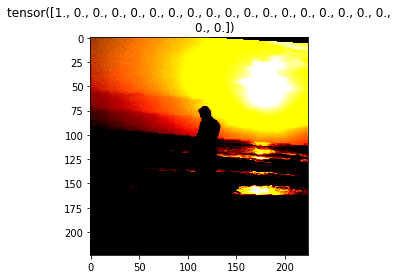

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


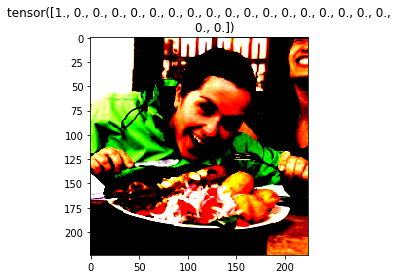

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


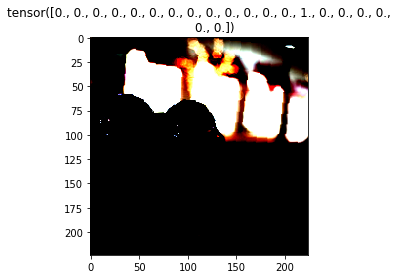

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


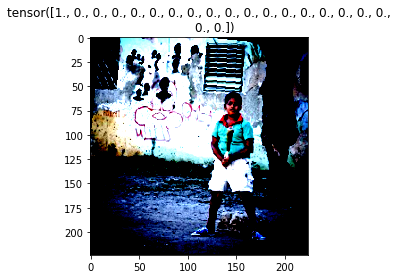

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


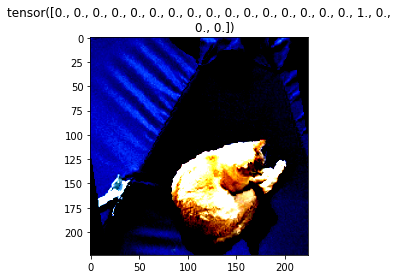

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


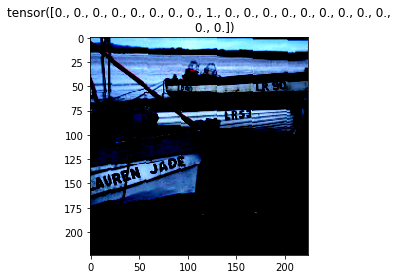

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


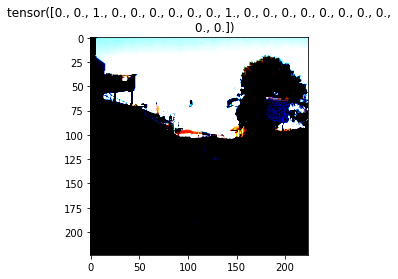

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


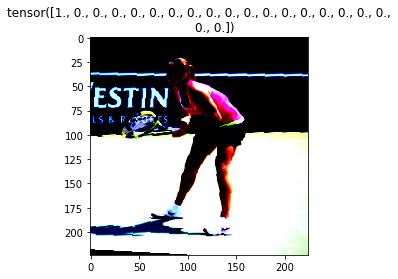

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


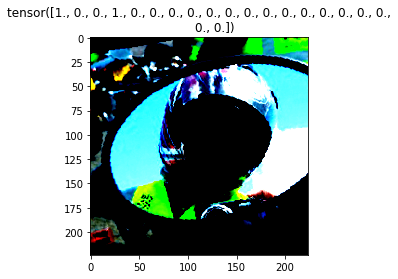

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


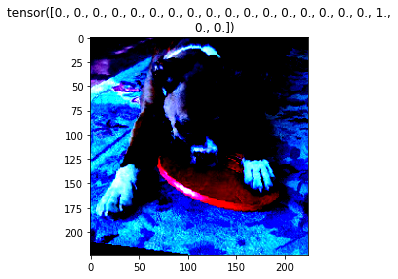

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


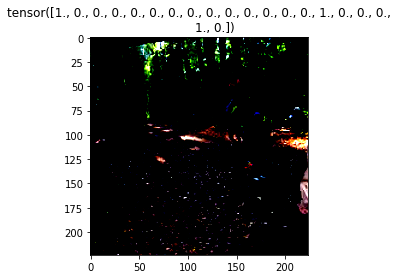

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


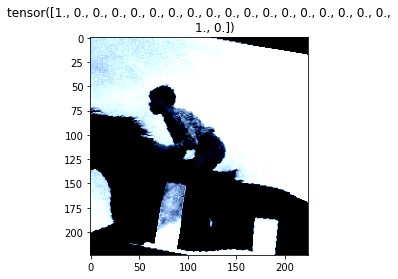

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


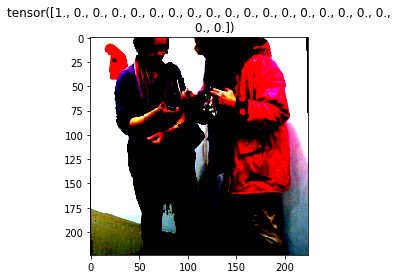

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


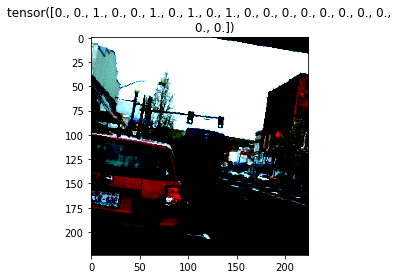

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


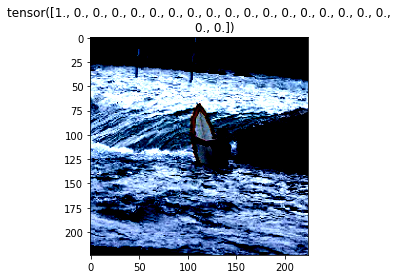

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


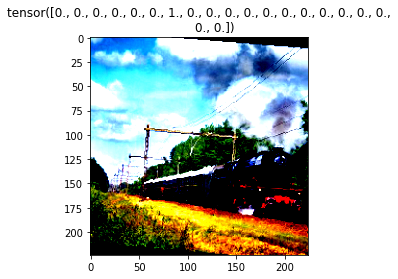

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


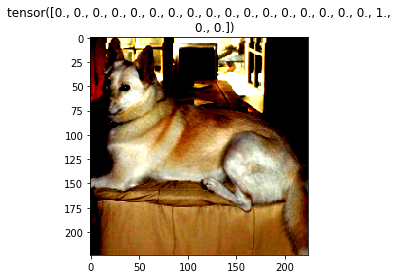

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


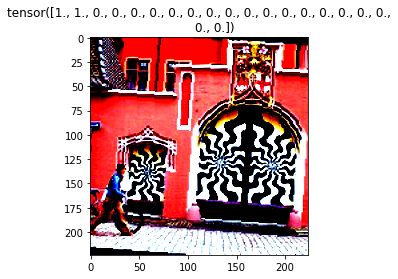

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


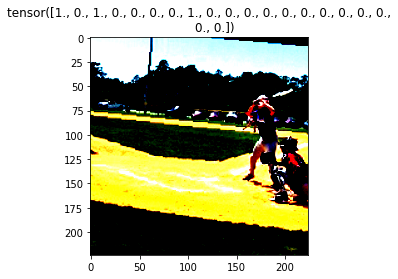

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


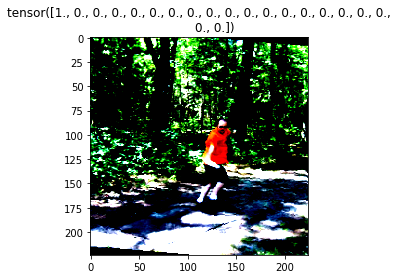

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


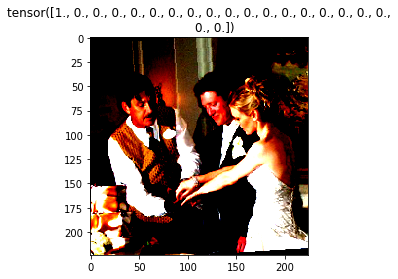

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


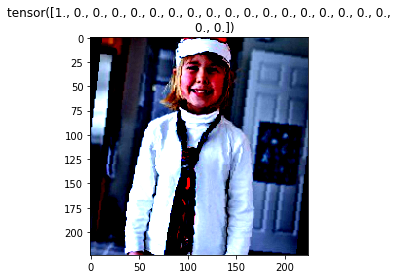

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


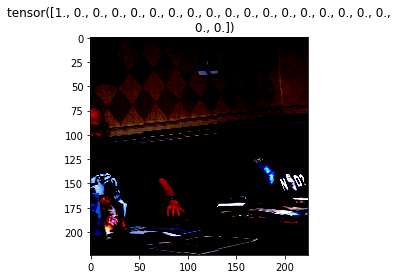

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


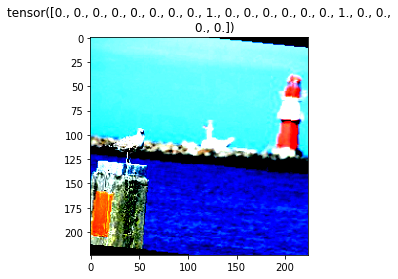

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


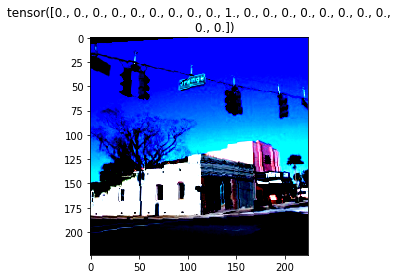

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


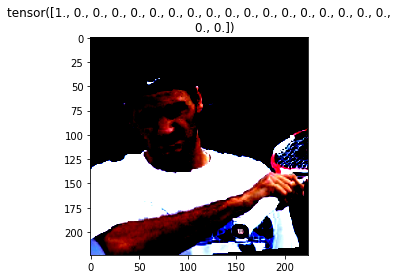

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


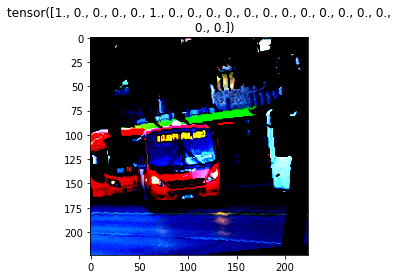

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


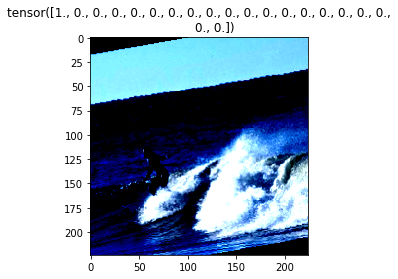

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


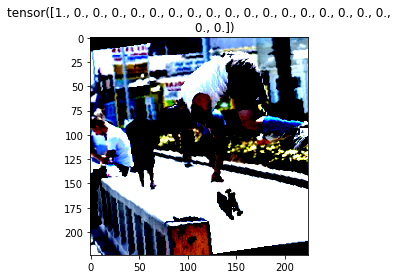

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


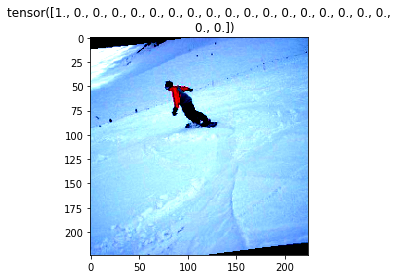

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


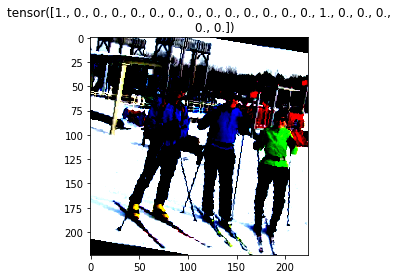

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


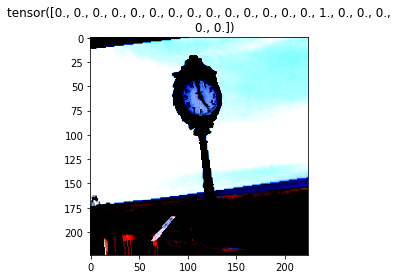

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


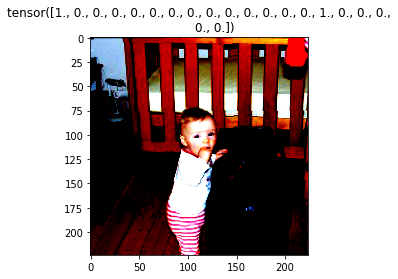

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


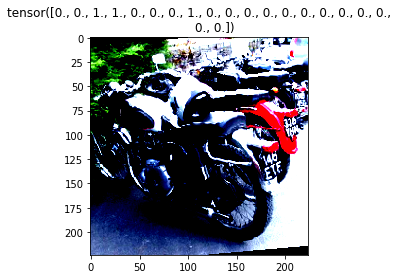

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


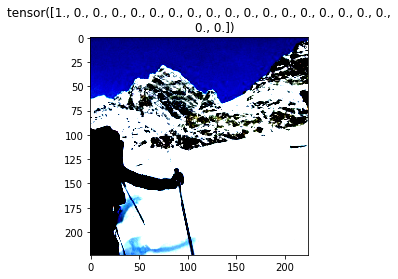

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


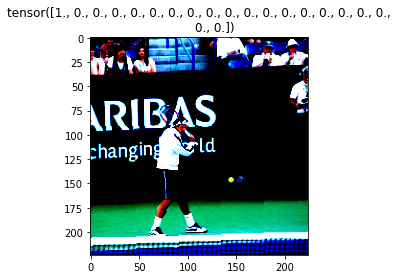

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


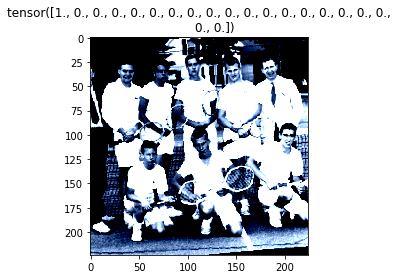

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


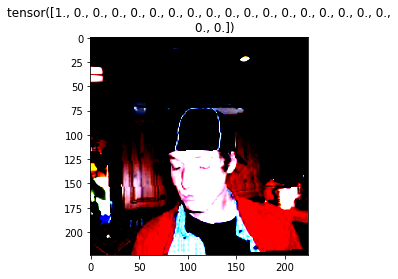

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


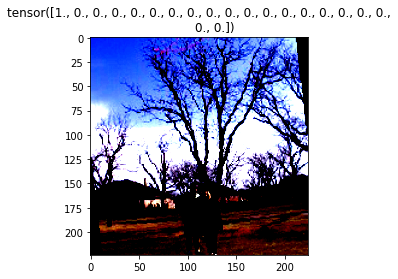

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


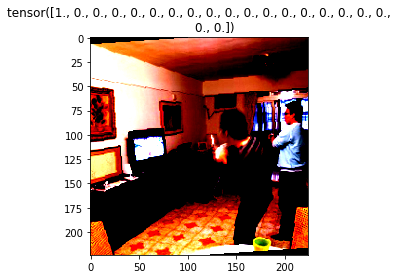

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


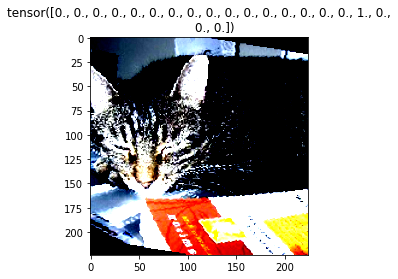

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


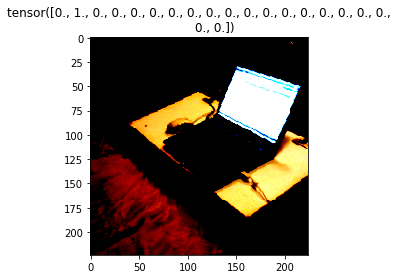

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


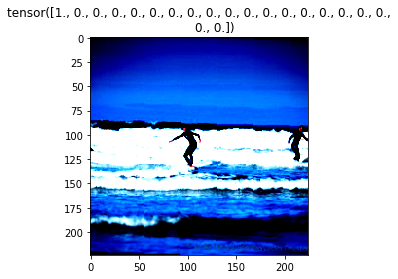

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


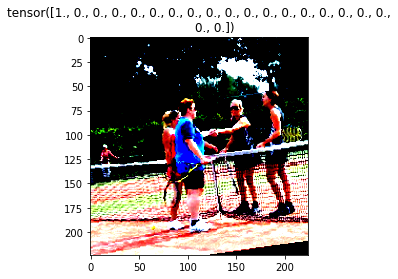

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


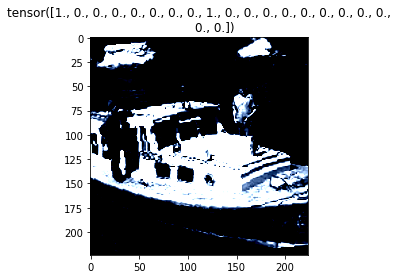

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


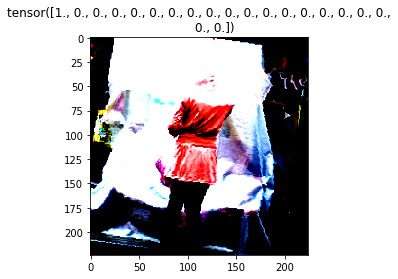

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


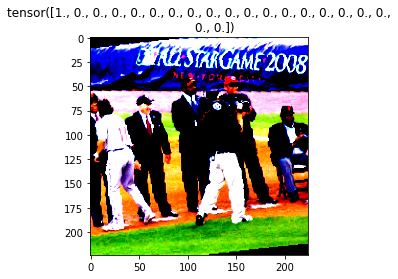

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


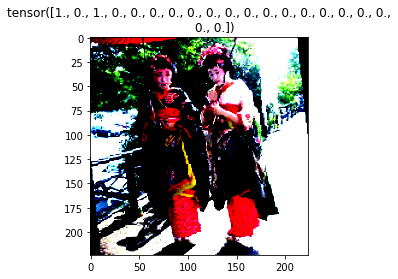

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


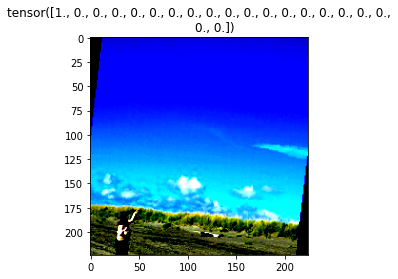

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


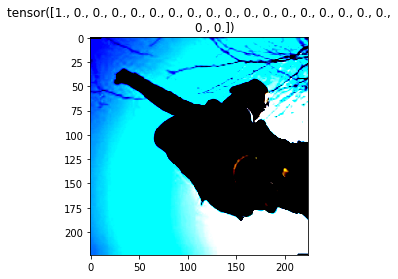

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


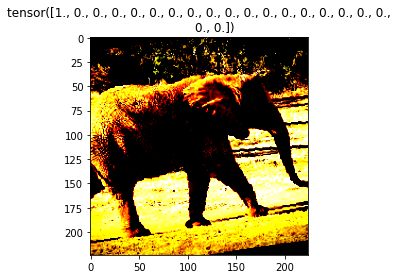

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


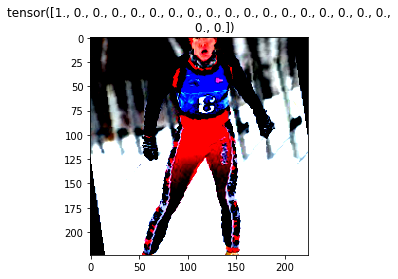

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


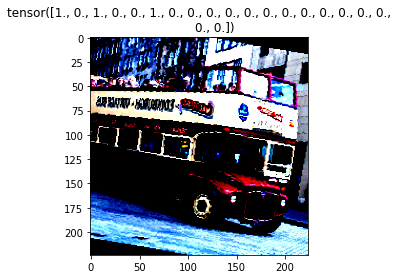

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


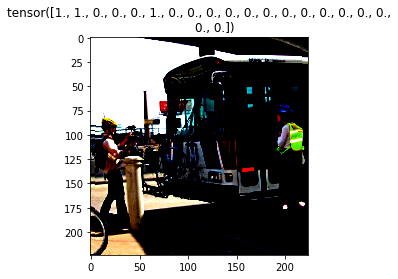

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


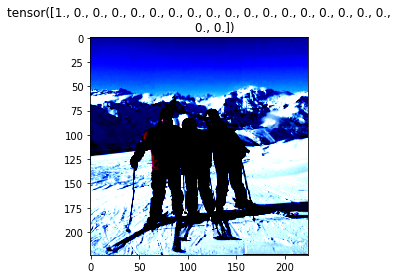

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


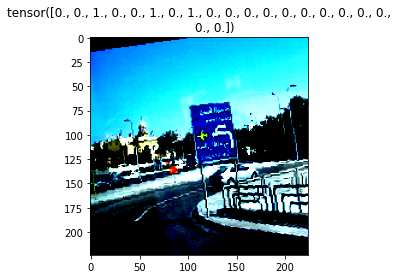

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


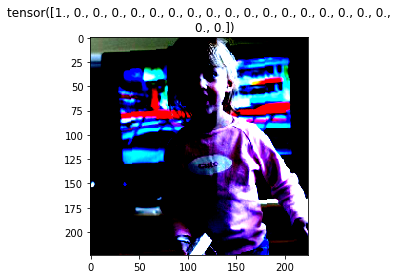

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


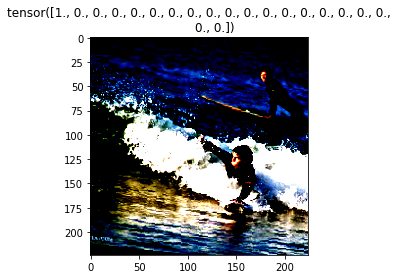

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


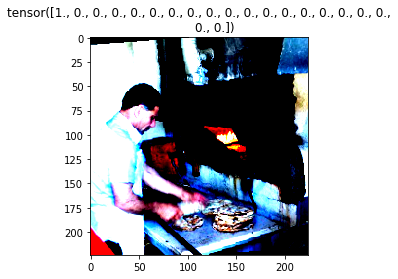

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


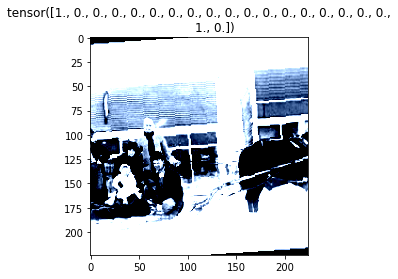

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


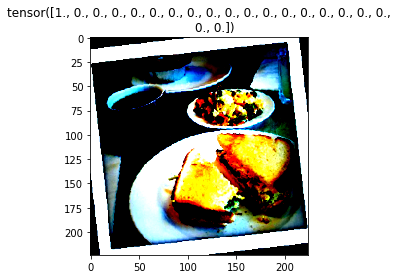

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


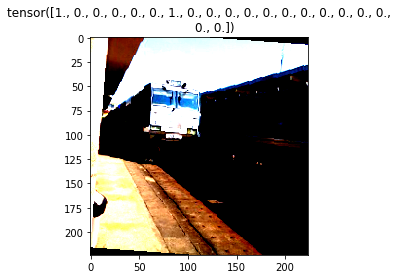

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


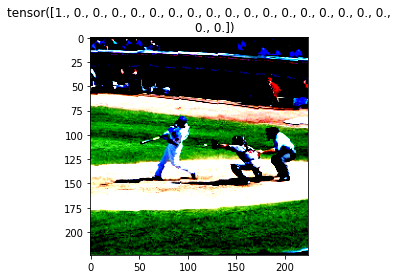

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


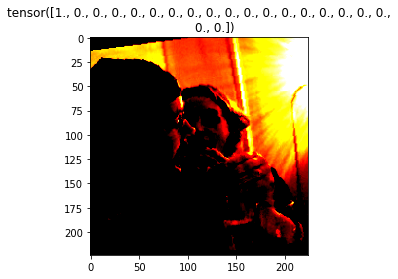

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


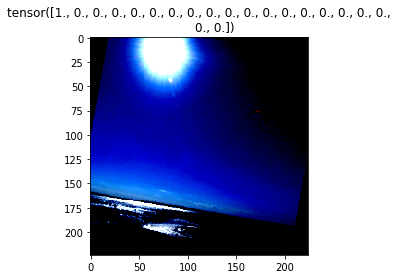

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


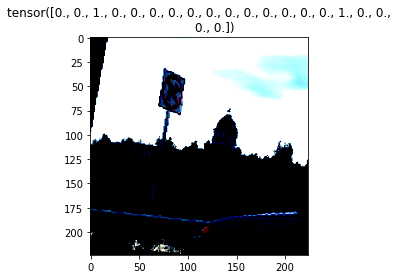

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


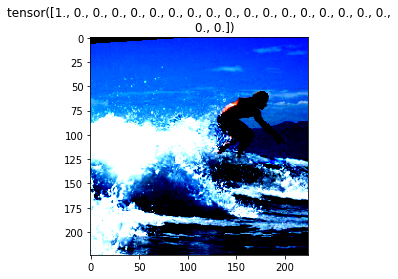

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


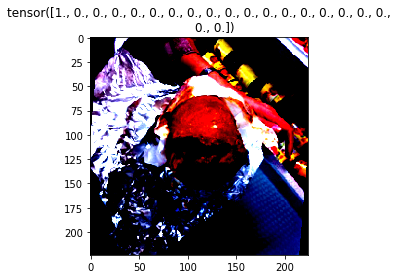

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


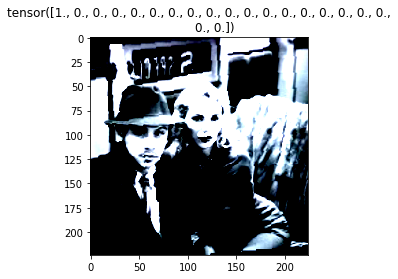

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


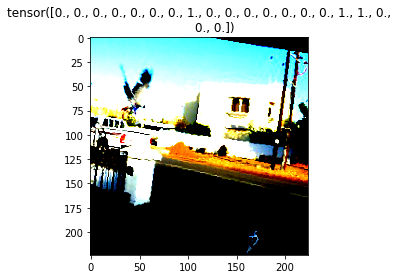

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


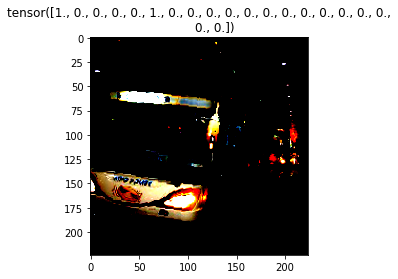

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


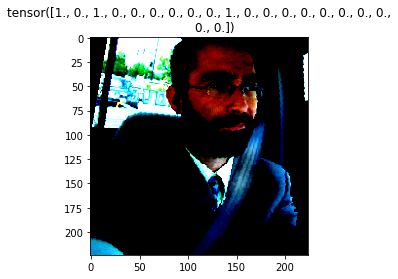

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


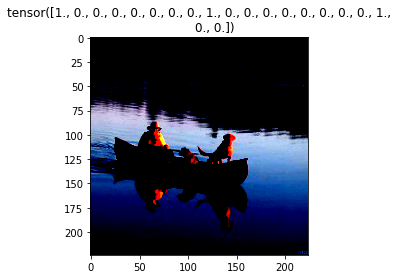

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


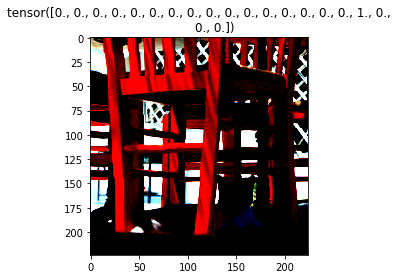

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


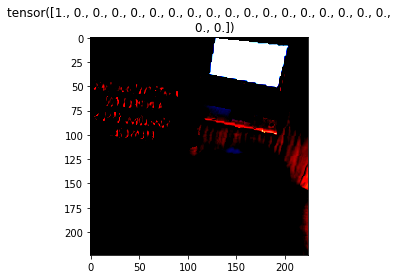

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


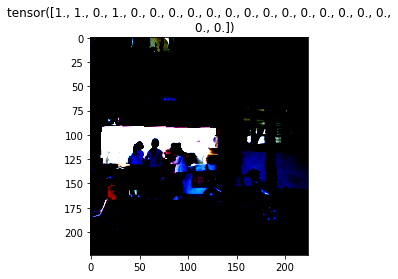

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


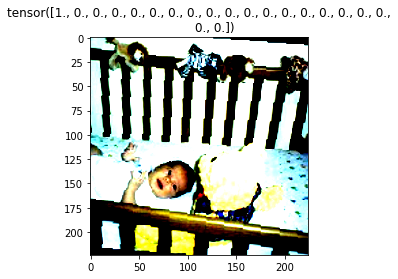

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


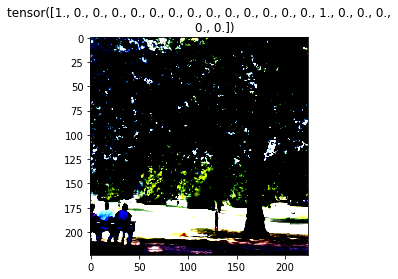

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


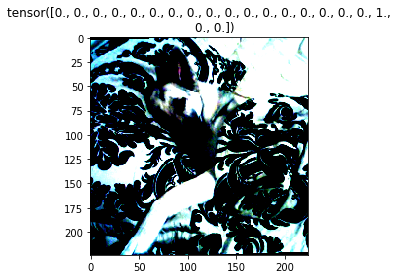

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


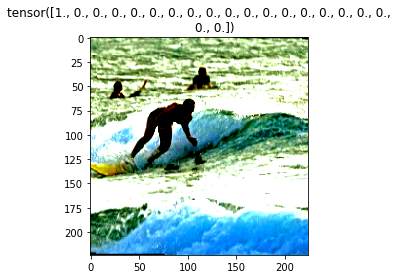

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


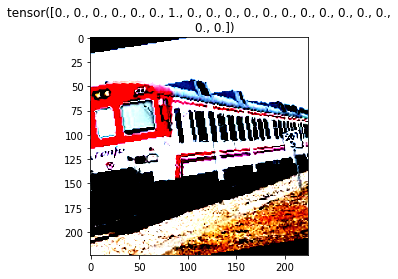

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


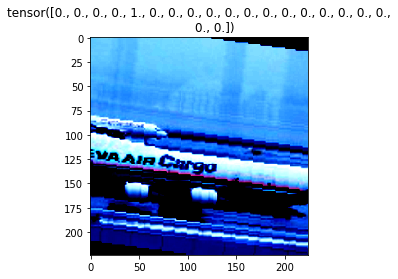

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


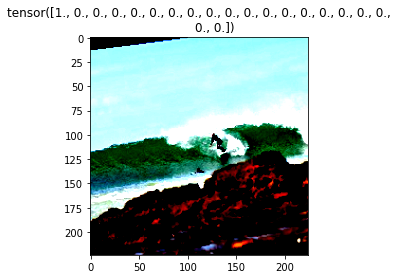

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


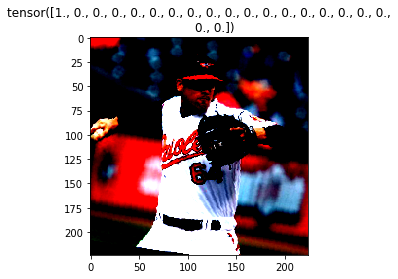

In [6]:
# Visualize some sample data

# obtain one batch of training images
dataiter = iter(train_loader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(batch_size):
    plt.show()
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    plt.title(labels[idx])

    

---
# Define the Model


1. Load in a pre-trained resnet18 model
2. "Freeze" all the parameters, so the net acts as a fixed feature extractor 


In [7]:
# Load the pretrained model from pytorch
model = torchvision.models.resnet18(pretrained=True)
cnt=0

# Freeze training for "features" layers before the 45th layers
for param in model.parameters():
    cnt+=1
print(cnt)

cnt=0
for param in model.parameters():
    if cnt<45:
        param.requires_grad = False
    cnt+=1
print(model)

62
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)

---
## Modify the Final Classifier Layer and disable weights update

modify the last layer to get the output size we need

In [8]:
import torch.nn as nn

n_inputs = model.fc.in_features
last_layer = nn.Linear(n_inputs, 20)
model.fc = last_layer

# if GPU is available, move the model to GPU
if train_on_gpu:
    model.cuda()

# check to see that your last layer produces the expected number of outputs
print(model.fc)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model.parameters()
print("Params to learn:")

feature_extract = True
if feature_extract:
    params_to_update = []
    for name,param in model.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model.named_parameters():
        if param.requires_grad == True:
            print("\t",name)


Linear(in_features=512, out_features=20, bias=True)
Params to learn:
	 layer4.0.conv1.weight
	 layer4.0.bn1.weight
	 layer4.0.bn1.bias
	 layer4.0.conv2.weight
	 layer4.0.bn2.weight
	 layer4.0.bn2.bias
	 layer4.0.downsample.0.weight
	 layer4.0.downsample.1.weight
	 layer4.0.downsample.1.bias
	 layer4.1.conv1.weight
	 layer4.1.bn1.weight
	 layer4.1.bn1.bias
	 layer4.1.conv2.weight
	 layer4.1.bn2.weight
	 layer4.1.bn2.bias
	 fc.weight
	 fc.bias


## Specify loss function and the optimizer


In [9]:
import torch.optim as optim
from torch.optim import lr_scheduler

# Send the model to GPU
model = model.cuda()

# Observe that all parameters are being optimized
optimizer = optim.Adam(params_to_update, lr=0.001)

# specify loss function (categorical cross-entropy)
criterion = nn.BCELoss()

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=1) #!!!!!!!!!!!!!!!!!!!!!!!! no decay now


## Training the model ( the best plot is in the report )

In [40]:
%%time
# number of epochs to train the model
n_epochs = 30
loss_log = {}
acc_log = {}
batch_num = 0
for epoch in range(1, n_epochs+1):
    exp_lr_scheduler.step()
    # keep track of training and validation loss
    train_loss = 0.0
    train_acc=0.0
    ###################
    # train the model #
    ###################
    # model by default is set to train
    for batch_i, (data, target) in enumerate(train_loader):
        
        model.train()
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        
        #!!! the out without sigmoid is even better!!! 
        preds_sig = torch.sigmoid(output) #!!!!!!!!!!!!!!!!!!!!!!!! 
        loss = criterion(preds_sig, target)
        
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss 
        train_loss += loss.item()
        
        model.eval()
        # round sigmoid result see get presiction labels
        preds= torch.round(preds_sig).detach().cpu().numpy()
        target = target.cpu().numpy()    
        
        correct = sum([str(preds[i]) == str(target[i]) for i in range(len(target))])
        train_acc += correct/len(target)
        
        
        if batch_i % 20 == 19:    # print training loss every specified number of mini-batches
            print('Epoch %d, Batch %d loss: %.16f,  acc: %.16f' %(epoch, batch_i + 1, train_loss / 20, train_acc / 20))
            batch_num += 20
            loss_log[batch_num] = train_loss / 20
            acc_log[batch_num] = train_acc / 20
            
            train_loss = 0.0
            train_acc = 0.0
            

Epoch 1, Batch 20 loss: 0.0743415286764502,  acc: 0.6398437500000000
Epoch 1, Batch 40 loss: 0.0748128049075603,  acc: 0.6367187500000000
Epoch 1, Batch 60 loss: 0.0753992896527052,  acc: 0.6328125000000000
Epoch 1, Batch 80 loss: 0.0780095309019089,  acc: 0.6300781250000000
Epoch 1, Batch 100 loss: 0.0780788175761700,  acc: 0.6410156250000000
Epoch 1, Batch 120 loss: 0.0786652233451605,  acc: 0.6144531250000000
Epoch 1, Batch 140 loss: 0.0819217111915350,  acc: 0.6152343750000000
Epoch 1, Batch 160 loss: 0.0835222907364368,  acc: 0.6035156250000000
Epoch 1, Batch 180 loss: 0.0822525791823864,  acc: 0.6042968750000000
Epoch 1, Batch 200 loss: 0.0774713996797800,  acc: 0.6292968750000000
Epoch 1, Batch 220 loss: 0.0781657155603170,  acc: 0.6171875000000000
Epoch 2, Batch 20 loss: 0.0642343111336231,  acc: 0.6722656250000000
Epoch 2, Batch 40 loss: 0.0707042202353478,  acc: 0.6351562500000000
Epoch 2, Batch 60 loss: 0.0688050143420696,  acc: 0.6519531250000000
Epoch 2, Batch 80 loss: 0.0

KeyboardInterrupt: 

## plot the loss and accuracy ( the best plot is in the report due to accidently rewrited the program, with epoch >30 it will be same as the report )

Text(0, 0.5, 'accuracy')

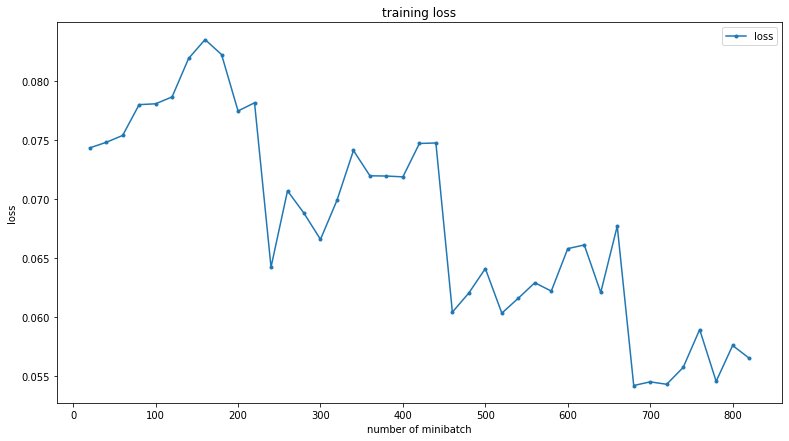

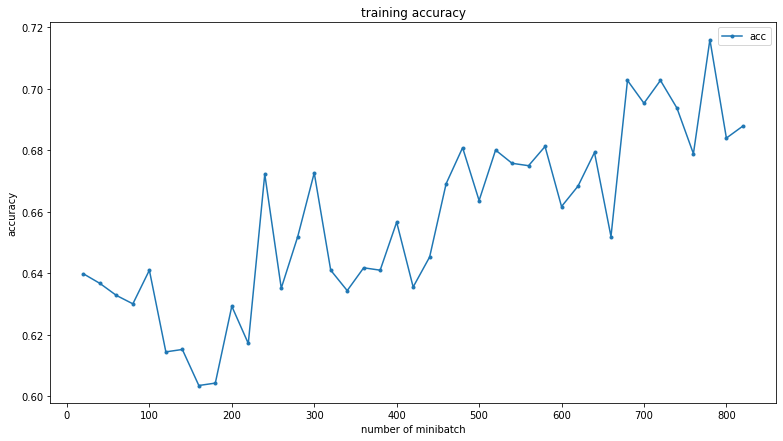

In [41]:
df_loss_plot= pd.DataFrame({'loss':pd.Series(loss_log)})
ax = df_loss_plot.plot(title ='training loss',figsize=(13, 7),marker='.')
ax.set_xlabel("number of minibatch")
ax.set_ylabel("loss")

df_acc_plot= pd.DataFrame({'acc':pd.Series(acc_log)})
ax = df_acc_plot.plot(title ='training accuracy',figsize=(13, 7),marker='.')
ax.set_xlabel("number of minibatch")
ax.set_ylabel("accuracy")

## Visualize Sample Test Results

<Figure size 1800x288 with 0 Axes>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


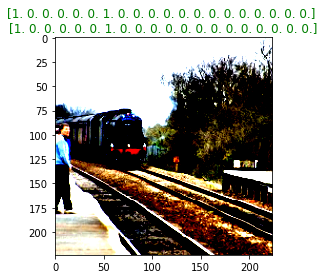

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


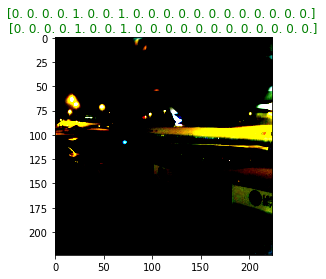

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


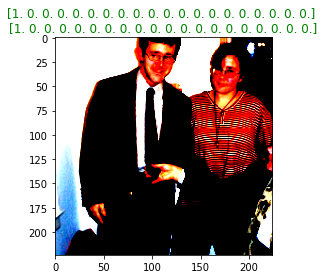

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


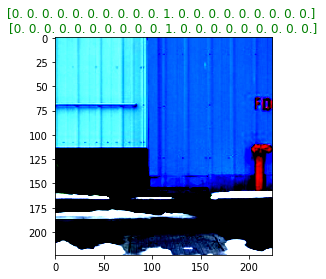

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


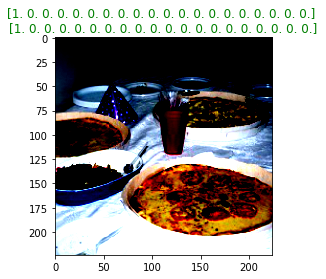

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


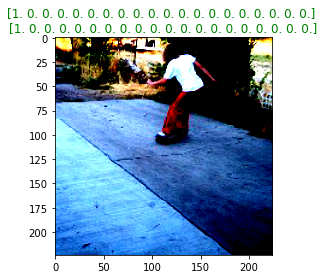

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


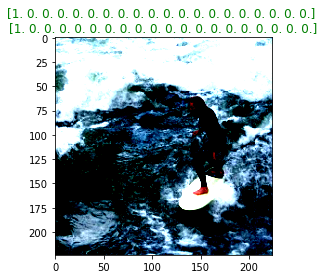

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


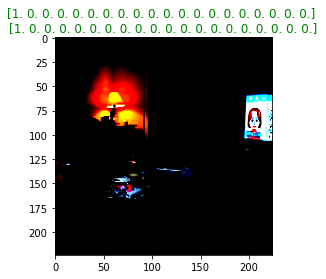

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


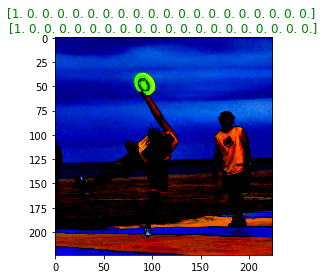

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


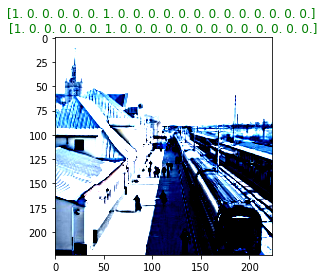

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


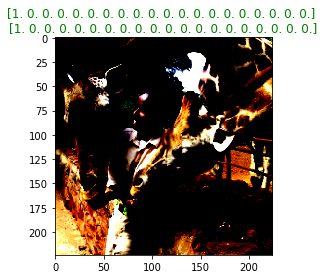

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


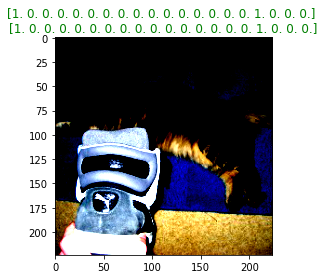

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


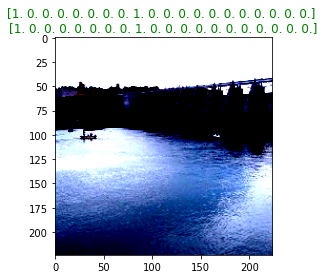

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


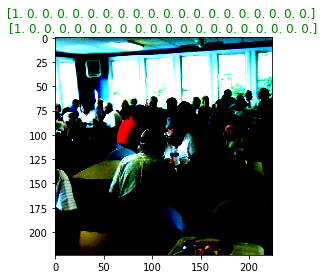

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


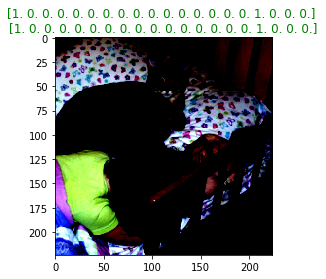

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


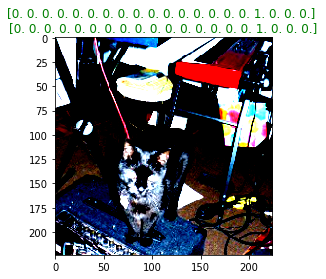

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


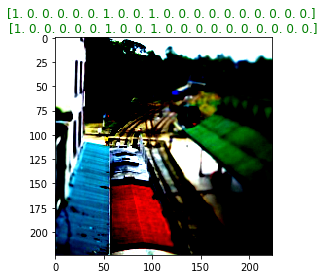

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


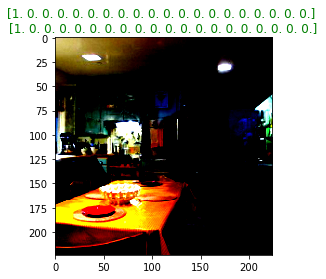

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


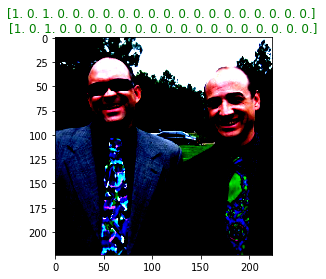

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


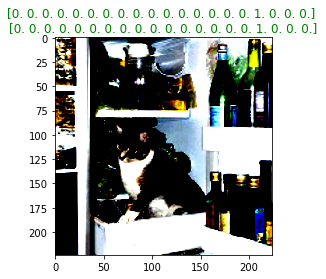

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


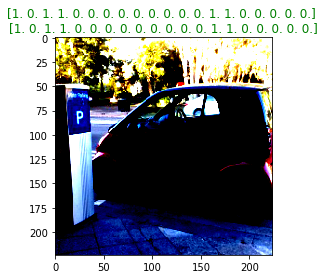

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


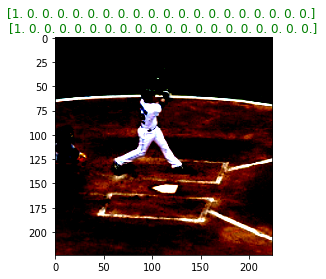

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


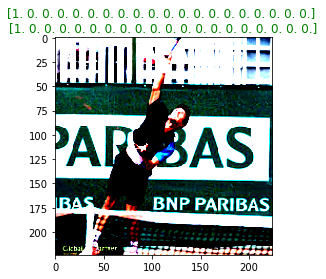

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


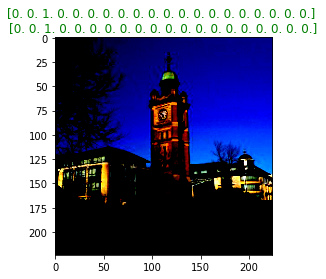

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


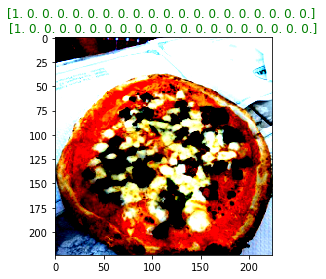

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


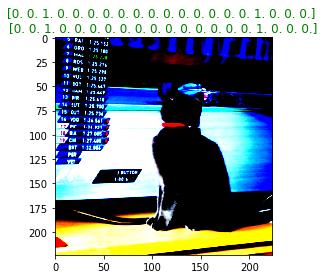

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


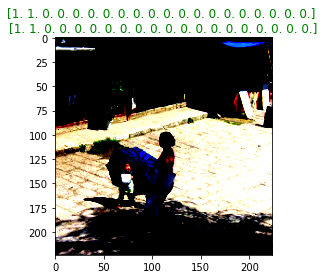

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


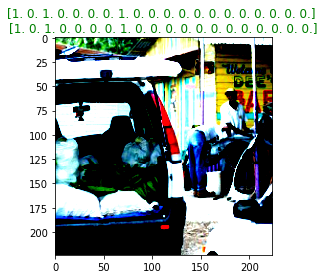

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


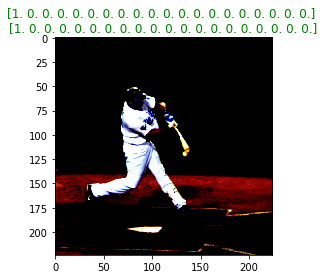

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


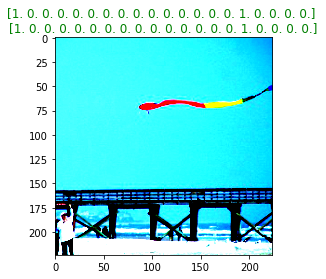

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


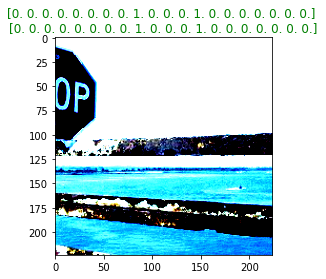

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


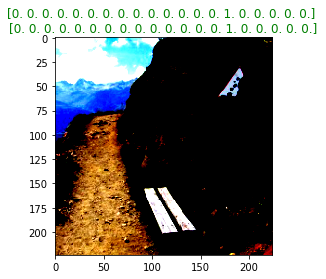

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


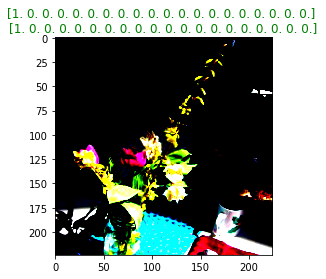

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


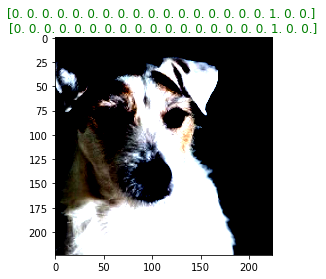

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


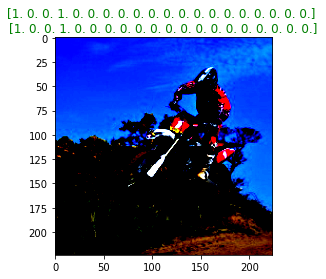

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


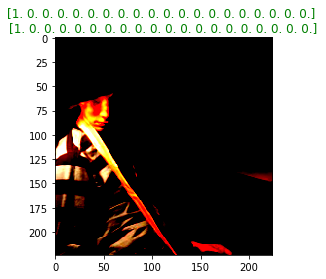

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


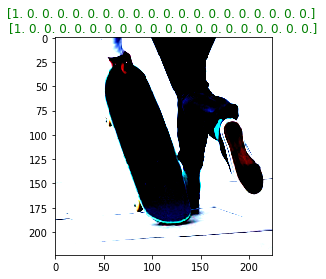

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


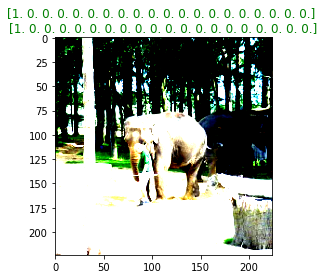

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


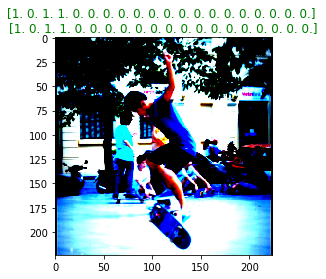

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


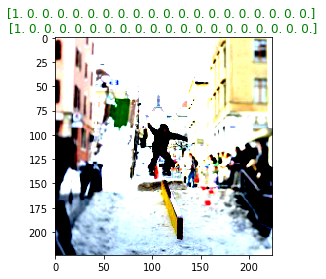

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


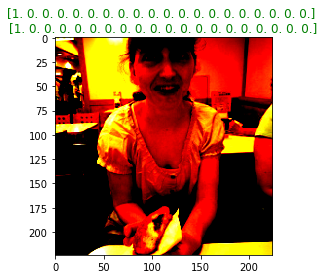

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


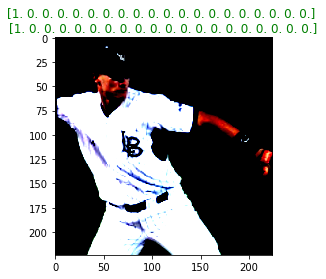

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


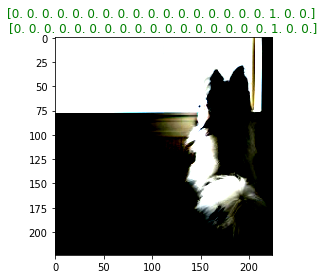

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


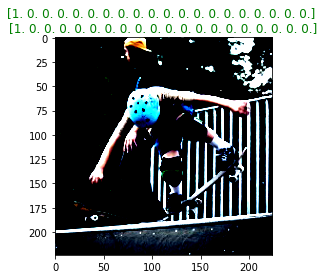

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


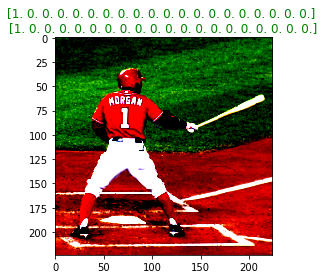

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


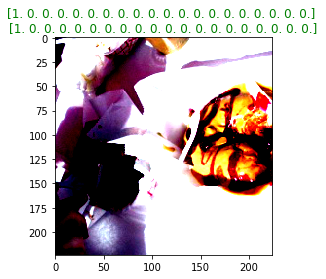

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


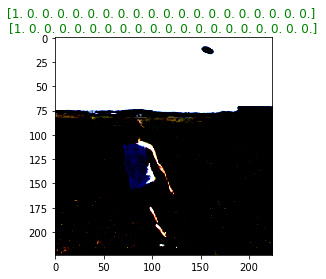

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


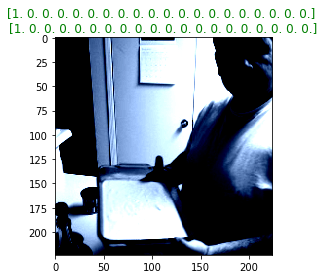

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


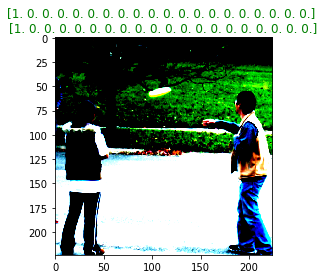

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


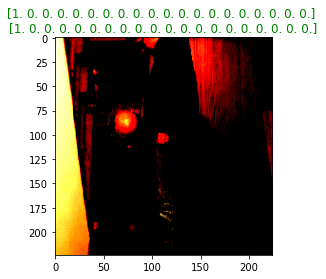

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


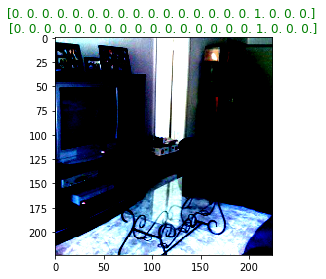

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


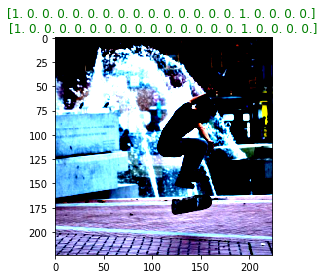

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


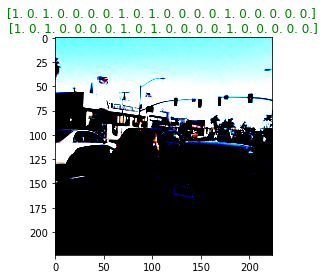

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


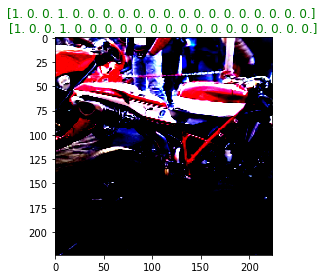

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


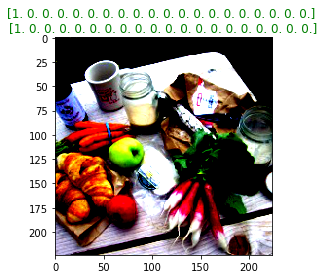

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


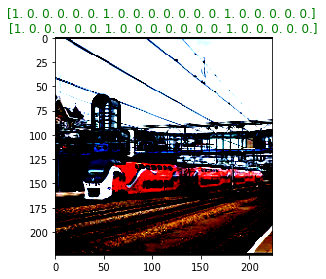

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


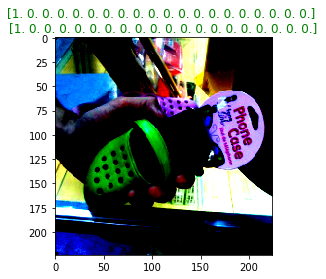

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


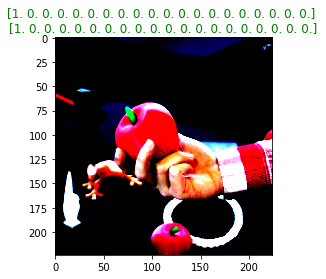

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


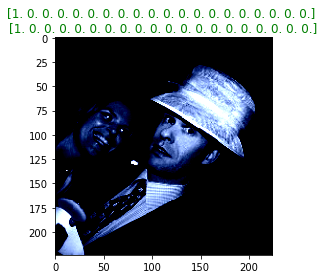

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


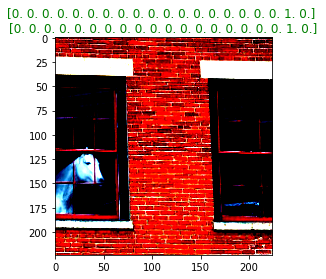

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


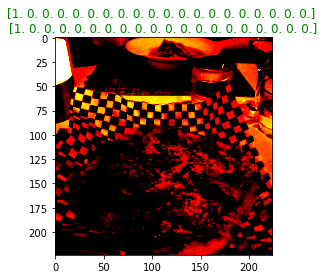

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


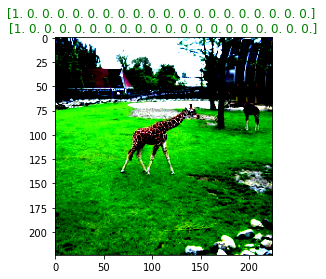

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


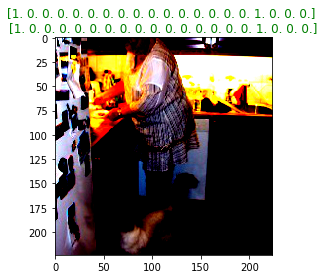

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


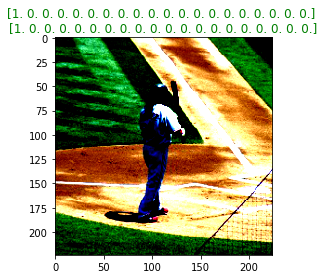

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


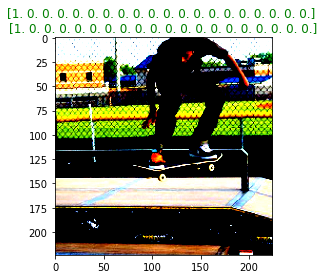

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


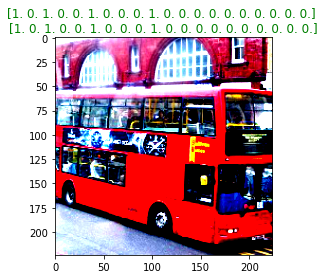

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


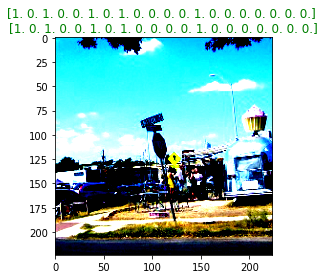

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


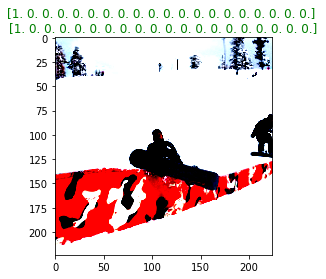

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


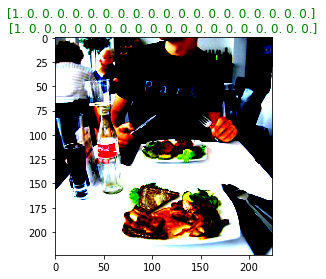

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


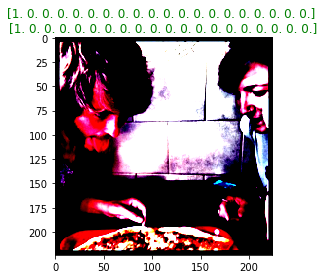

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


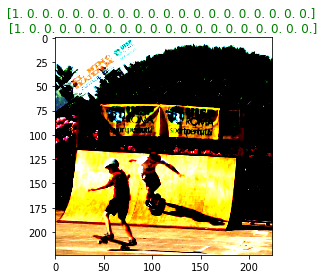

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


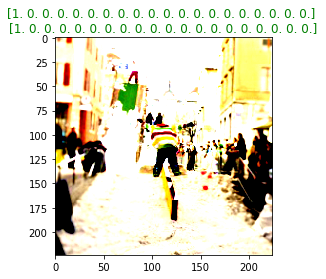

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


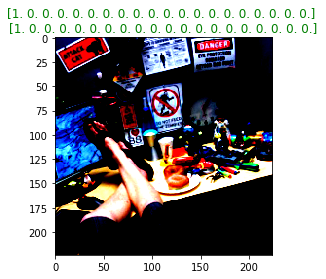

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


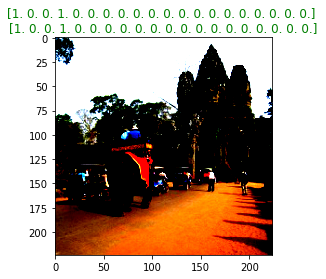

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


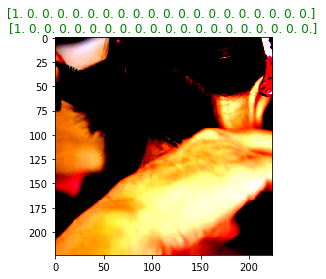

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


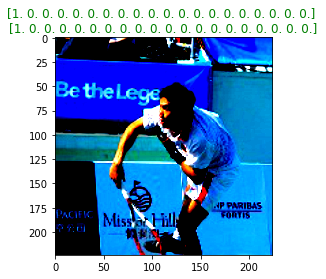

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


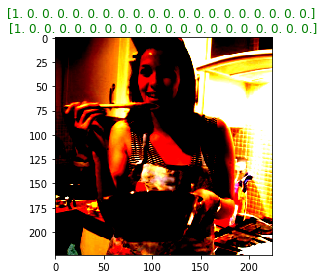

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


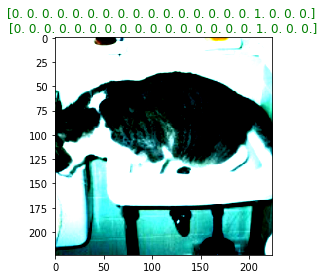

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


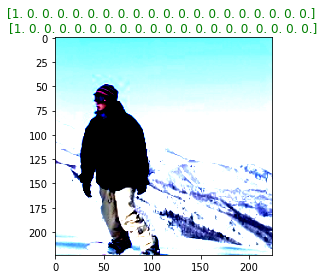

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


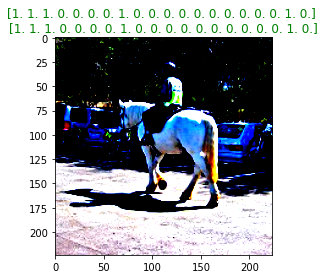

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


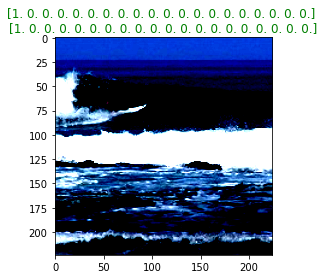

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


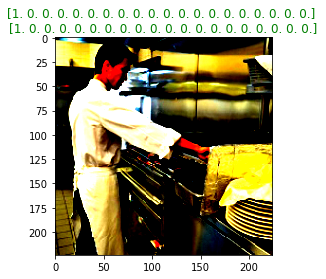

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


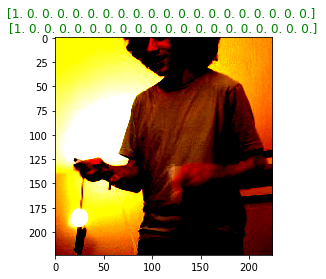

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


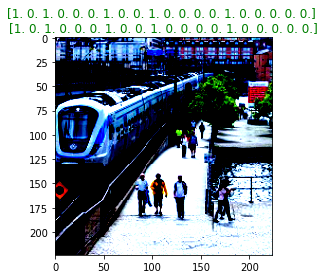

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


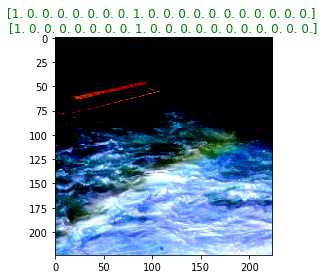

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


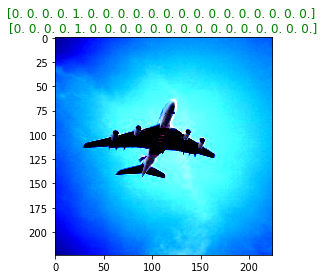

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


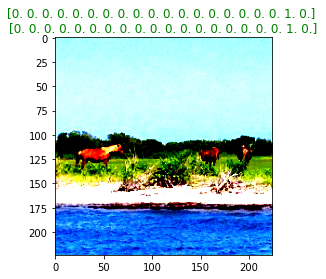

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


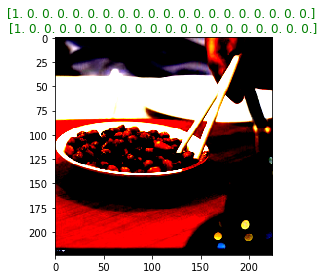

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


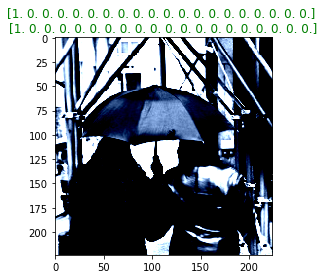

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


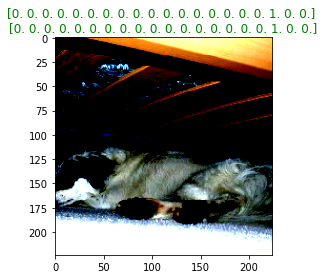

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


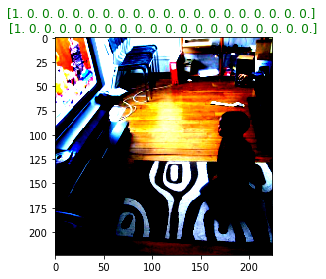

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


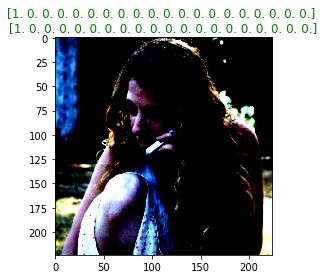

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


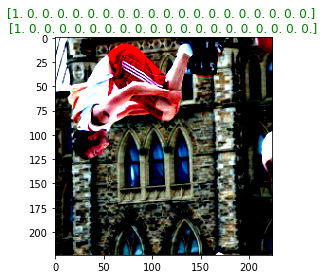

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


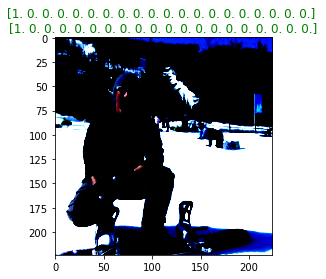

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


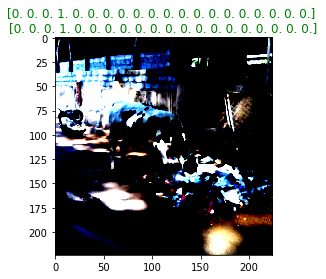

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


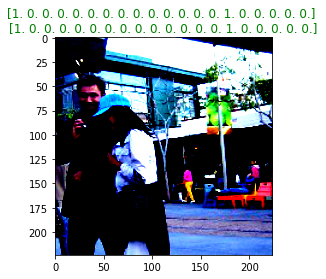

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


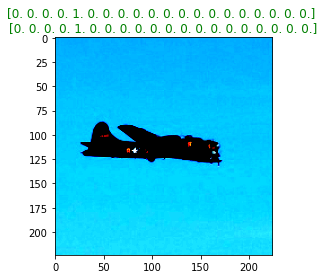

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


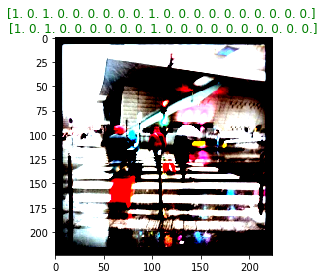

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


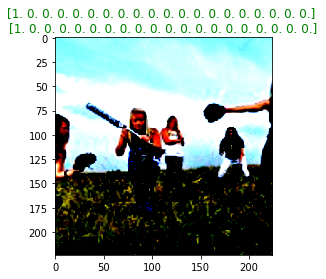

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


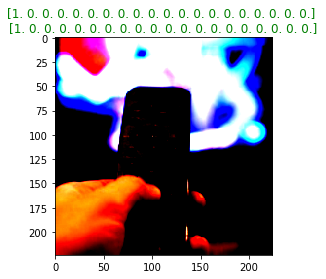

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


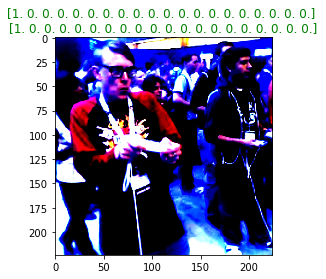

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


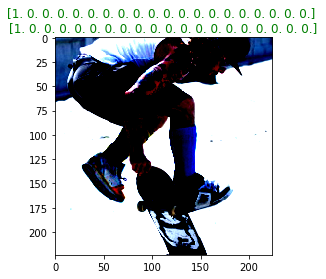

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


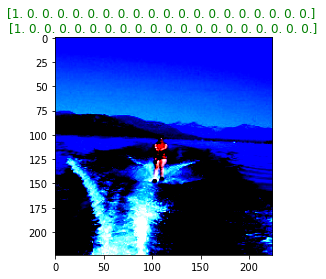

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


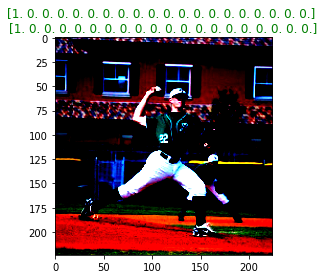

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


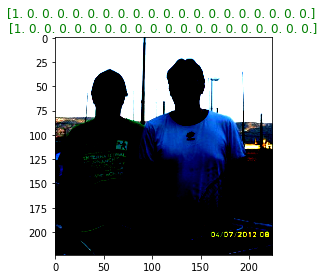

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


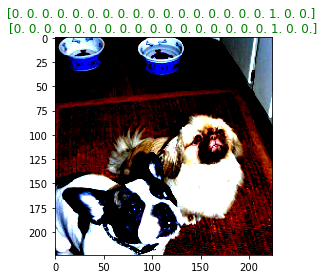

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


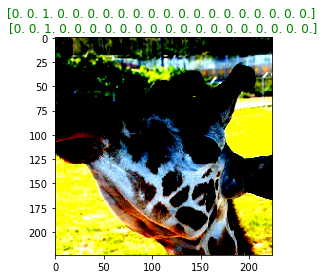

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


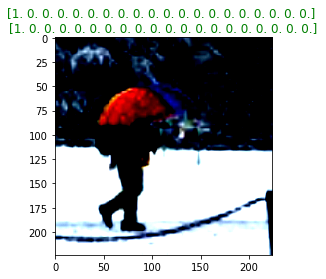

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


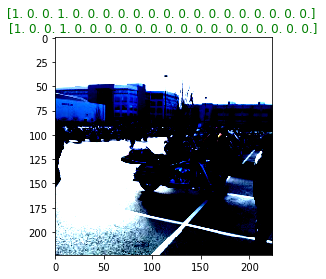

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


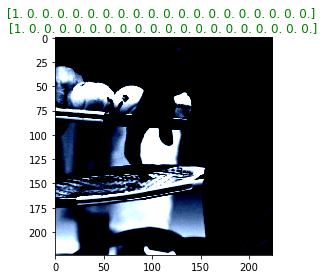

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


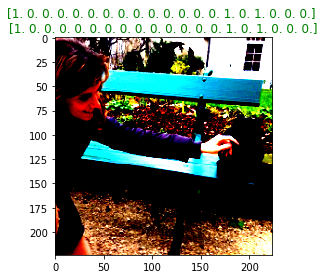

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


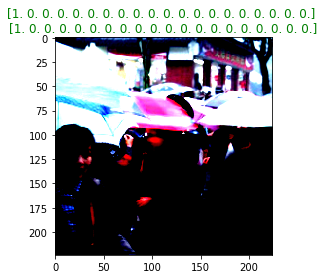

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


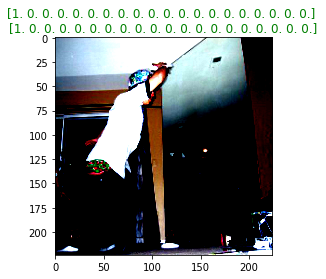

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


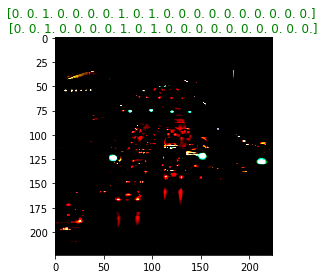

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


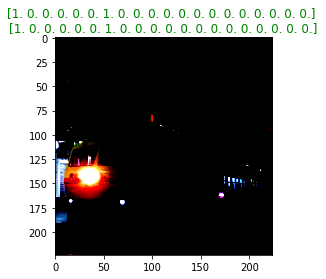

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


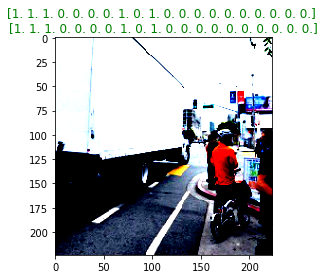

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


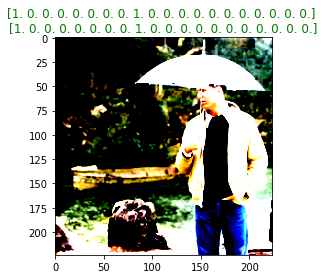

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


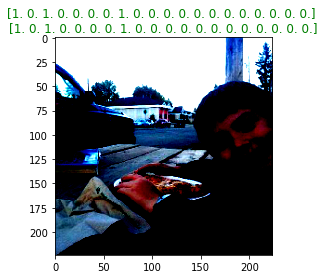

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


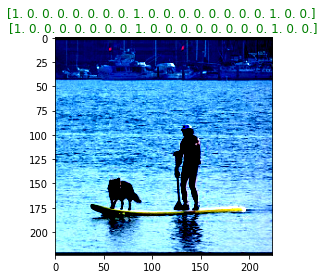

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


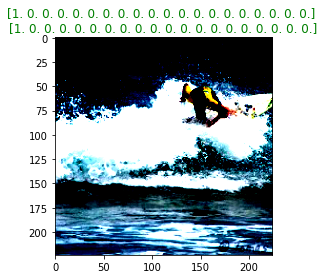

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


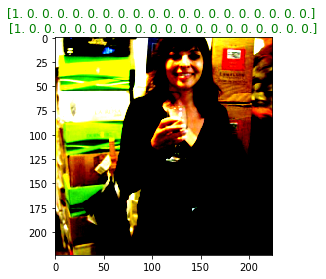

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


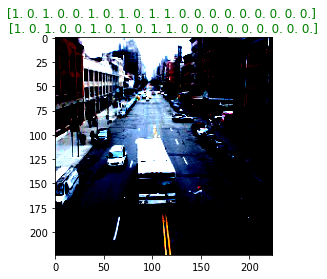

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


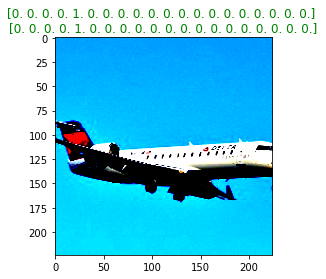

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


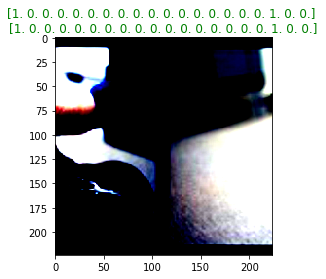

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


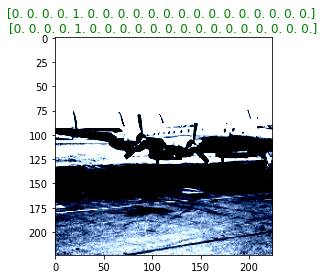

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


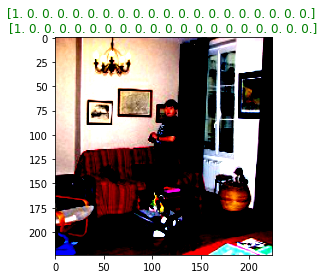

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


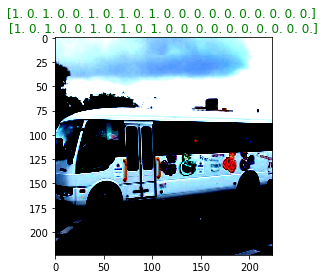

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


accuracy is :
1.0
smaple
128


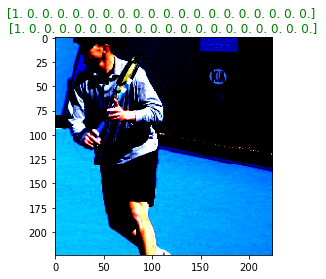

In [13]:
# obtain one batch of test images
model.eval()
acc=[]

dataiter = iter(val_loader)
images, labels = dataiter.next()
images.numpy()

# move model inputs to cuda, if GPU available
if train_on_gpu:
    images = images.cuda()

# get sample outputs
output = model(images)
# convert output probabilities to predicted class
#_, preds_tensor = torch.max(output, 1)
#preds = np.squeeze(preds_tensor.numpy()) if not train_on_gpu else np.squeeze(preds_tensor.cpu().data.numpy())

preds_sig = torch.sigmoid(output)
preds= torch.round(preds_sig).detach().cpu().numpy()
labels_l = labels.cpu().numpy()



images = images.cpu()
# plot the images in the batch, along with predicted and true labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(batch_size):
    plt.show()
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    
    plt.title("{} \n{}".format(preds[idx], labels_l[idx]),
                 color=("green" if list(preds[idx])==list(labels_l[idx]) else "red"))
    
    acc.append( list(preds[idx])==list(labels_l[idx]))
print('accuracy is :')
print(sum(acc)/len(acc))
print('smaple')
print(len(acc))

In [ ]:
torch.save(model, fr'{pathParent}/Output/5329_A2_model.pt')

## load the image classification model

In [12]:
# Load the pretrained model from pytorch
pathParent = os.path.abspath('..')
model = torchvision.models.resnet18(pretrained=True)
model = torch.load(fr'{pathParent}/Output/5329_A2_model.pt')
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

# Predict the output for leaderboard testset

### put the testset into dataloader

In [14]:
df_test= pd.read_csv(filepathtt, usecols=[0,1])
df_test
df_test_labels = df_test[['ImageID']]

for i in range(1,21):
    df_test_labels[str(i)] = 0
    
df_test_labels

testset = df_test_labels
img_test_dir =  fr'{pathParent}/Input/data/'

testset= MyDataset(testset, img_test_dir , transforms= val_transform)
testset_loader =  torch.utils.data.DataLoader(testset , shuffle=False, batch_size=batch_size)


### visulized the testset

<Figure size 1800x288 with 0 Axes>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


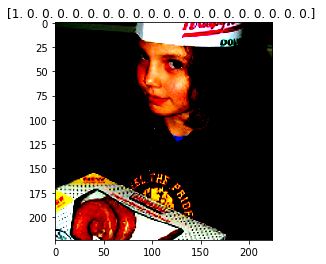

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


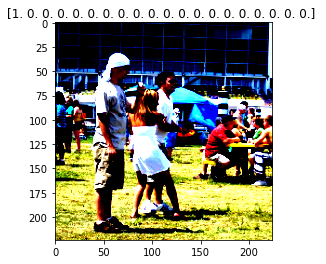

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


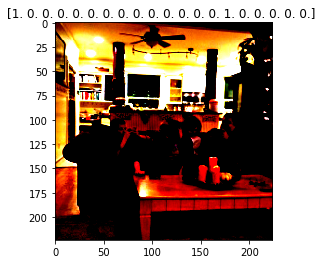

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


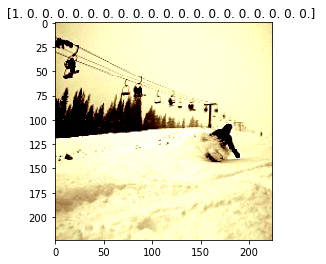

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


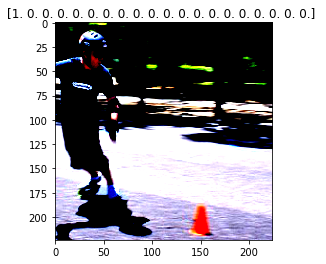

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


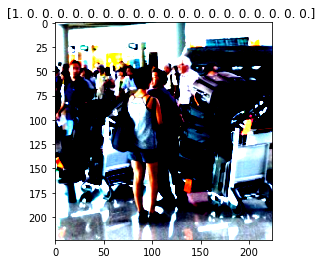

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


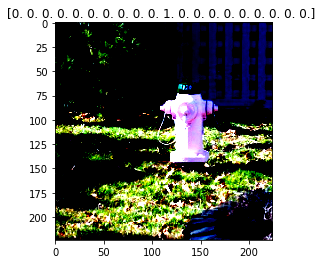

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


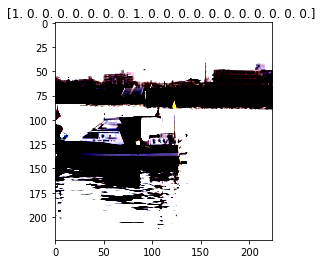

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


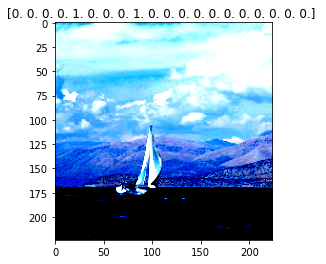

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


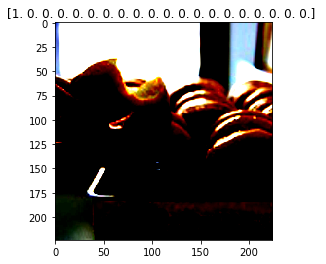

In [15]:
# obtain one batch of test images
dataiter = iter(testset_loader)
images, labels = dataiter.next()
images.numpy()

# move model inputs to cuda, if GPU available
if train_on_gpu:
    images = images.cuda()

# get sample outputs
output = model(images)
# convert output probabilities to predicted class
#_, preds_tensor = torch.max(output, 1)
#preds = np.squeeze(preds_tensor.numpy()) if not train_on_gpu else np.squeeze(preds_tensor.cpu().data.numpy())

preds_sig = torch.sigmoid(output)
preds= torch.round(preds_sig).detach().cpu().numpy()
labels_l = labels.cpu().numpy()

acc=[]

images = images.cpu()
# plot the images in the batch, along with predicted and true labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    plt.show()
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    
    plt.title("{} ".format(preds[idx]))
    
    acc.append( list(preds[idx])==list(labels_l[idx]))
  

### Predict the testset : store the prediction one-hot labels and the ranking of prediction sigmoid value

In [16]:
model.eval()
preds_alltest = []
order_preds_alltest= []

for batch_i, (images, target) in enumerate(testset_loader):
    #print(batch_i)
    
    if train_on_gpu:
        images = images.cuda()

    # get sample outputs
    output = model(images)
    preds_sig = torch.sigmoid(output)
    preds_sig =preds_sig.detach().cpu().numpy()
    
    preds = np.round(preds_sig)
    preds_alltest.append(preds)
    
    rank_preds_sig = [ss.rankdata(preds_sig[i]) for i in range(len(preds_sig))] # rank the prediction values for labels order
    order_preds_alltest.append(rank_preds_sig)
    

### preprocess the result- join all the minibatches predictions

In [17]:
# ==============================habdle the label=================================
preds_alltest_joined= []
for preds in preds_alltest:
    for pred in preds:
        preds_alltest_joined.append(pred)
        

preds_alltest_joined = preds_alltest_joined[:len(df_test)]

# ==============================habdle the order=================================
order_preds_alltest_joined= []
for orders in order_preds_alltest:
    for order in orders:
        order_preds_alltest_joined.append(order)
        
order_preds_alltest_joined = order_preds_alltest_joined[:len(df_test)]

In [18]:
labels_out = []
orders_out = []

for j in range(len(preds_alltest_joined)):
    labels_out.append([])
    orders_out.append([])
    if sum(preds_alltest_joined[j]) ==0:
        preds_alltest_joined[j][-1] =1
    
    for i in range(len(preds_alltest_joined[j])):
        if preds_alltest_joined[j][i]==1 : 
            labels_out[-1].append(i+1)
            orders_out[-1].append(order_preds_alltest_joined[j][i])
            
        

### sort order for prediction labels based on the ranking of sigmoid output

In [19]:
df_out = df_test[['ImageID']][:]
#df_out['Order_all'] = order_preds_alltest_joined
df_out['Labels_N'] = labels_out
df_out['Order'] = orders_out

order_list=[]

for i in range(len(df_out)):
    X= df_out['Labels_N'][i].copy()
    Y= df_out['Order'][i].copy()
    keydict = dict(zip(X, Y))
    X.sort(key=keydict.get,reverse = True)
    order_list.append(X)
order_list

df_out['Labels'] = order_list
df_out['Labels'] = df_out['Labels'].astype(str)
df_out['Labels'] = df_out['Labels'].str.replace(',','').str.replace('[','').str.replace(']','')
df_out.tail(100)

,ImageID,Labels_N,Order,Labels
9900,39900.jpg,[17],[20.0],17
9901,39901.jpg,[1],[20.0],1
9902,39902.jpg,[1],[20.0],1
9903,39903.jpg,[1],[20.0],1
9904,39904.jpg,"[1, 4]","[20.0, 19.0]",1 4
...,...,...,...,...
9995,39995.jpg,[20],[12.0],20
9996,39996.jpg,"[3, 4, 8]","[19.0, 19.0, 19.0]",3 4 8
9997,39997.jpg,[1],[20.0],1
9998,39998.jpg,[1],[20.0],1


## Generate results to ouput folder

In [41]:
lable_out_dir =  fr'{pathParent}/Output/Predicted_labels_img.txt'
df_out_file = df_out[['ImageID','Labels']]
df_out_file.to_csv (lable_out_dir, index = False, header=True)

df_result_file_dir =  fr'{pathParent}/Output/df_result_file.txt'
df_out.to_csv (df_result_file_dir, index = False, header=True)

# **Combine the labels from language model(optional, result from section 3)
READ ME:
(If you dont have the 'Predicted_labels_nlp.txt' in the Output folder, you need to run the language model at Section 3 of this notebook)

In [20]:
import pandas as pd
import numpy as np
path = fr'{pathParent}\Output'

# read the prediction files from both models
df_img = pd.read_csv(path+"\Predicted_labels_img.txt", delimiter=',')
df_nlp = pd.read_csv(path+"\Predicted_labels_nlp.txt",delimiter=',')

## combine the labels and then sort the labels based on the ranking of sigmoid value

In [21]:

df_nlp['lList']= df_nlp['Labels'].str.split(' ')
df_img['Labels_N']= df_img['Labels'].str.split(' ')
df_img['Labels_L'] = df_nlp['lList']
df_img['Order_all']= 0
df_img['Order_all'] = df_img['Order_all'].astype('object')
df_img['Order_all'] = order_preds_alltest_joined
df_img['Labels_combined'] = df_img['Labels_N'].copy()
[df_img['Labels_combined'][i].extend(df_img['Labels_L'][i]) for i in range(len(df_img))]
df_img['Labels_combined'] = [list(set(df_img['Labels_combined'][i])) for i in range(len(df_img))]
df_img['Labels_combined'] = [[int(i) for i in df_img['Labels_combined'][j]] for j in range(len(df_img))]
[df_img['Labels_combined'][j].sort() for j in range(len(df_img))]

order_list = []
df= df_img
serie_label = df_img['Labels_combined']
serie_order = df_img['Order_all']

for i in range(len(df)):
    order_list.append([])
    labels = serie_label[i]
    for j in range(len(labels)):
        order_list[-1].append(serie_order[i][labels[j]-1])
        
df_img['Order'] = order_list

order_list=[]

for i in range(len(df_out)):
    X= df_img['Labels_combined'][i].copy()
    Y= df_img['Order'][i].copy()
    keydict = dict(zip(X, Y))
    X.sort(key=keydict.get,reverse = True)
    order_list.append(X)
order_list

df_img['Labels_ordered'] = order_list
df_img.tail(30)

,ImageID,Labels,Labels_N,Labels_L,Order_all,Labels_combined,Order,Labels_ordered
9970,39970.jpg,10 3 7 8,"[10, 3, 7, 8, 3, 10]","[3, 10]","[14.0, 10.0, 19.0, 13.0, 9.0, 15.0, 18.0, 17.0...","[3, 7, 8, 10]","[19.0, 18.0, 17.0, 20.0]","[10, 3, 7, 8]"
9971,39971.jpg,4 3,"[4, 3, 3, 4, 8]","[3, 4, 8]","[14.0, 16.0, 19.0, 20.0, 3.0, 6.0, 10.0, 17.0,...","[3, 4, 8]","[19.0, 20.0, 17.0]","[4, 3, 8]"
9972,39972.jpg,6 1 10,"[6, 1, 10, 1, 3, 8]","[1, 3, 8]","[19.0, 12.0, 17.0, 9.0, 11.0, 20.0, 16.0, 15.0...","[1, 3, 6, 8, 10]","[19.0, 17.0, 20.0, 15.0, 18.0]","[6, 1, 10, 3, 8]"
9973,39973.jpg,10 3,"[10, 3, 10]",[10],"[17.0, 6.0, 19.0, 10.0, 3.0, 18.0, 14.0, 7.0, ...","[3, 10]","[19.0, 20.0]","[10, 3]"
9974,39974.jpg,1,"[1, 1]",[1],"[20.0, 15.0, 19.0, 10.0, 1.0, 13.0, 3.0, 8.0, ...",[1],[20.0],[1]
9975,39975.jpg,1,"[1, 1]",[1],"[20.0, 8.0, 14.0, 9.0, 7.0, 5.0, 15.0, 19.0, 1...",[1],[20.0],[1]
9976,39976.jpg,1,"[1, 1]",[1],"[20.0, 7.0, 11.0, 18.0, 3.0, 1.0, 5.0, 17.0, 1...",[1],[20.0],[1]
9977,39977.jpg,1,"[1, 1]",[1],"[20.0, 4.0, 8.0, 9.0, 16.0, 11.0, 2.0, 5.0, 19...",[1],[20.0],[1]
9978,39978.jpg,1,"[1, 1]",[1],"[20.0, 17.0, 19.0, 15.0, 2.0, 6.0, 1.0, 4.0, 5...",[1],[20.0],[1]
9979,39979.jpg,1,"[1, 1]",[1],"[20.0, 17.0, 18.0, 14.0, 1.0, 8.0, 2.0, 3.0, 4...",[1],[20.0],[1]


## Generate results to ouput folder

In [44]:
df_out = df_img[['ImageID','Labels']]
df_out['Labels'] = df_img['Labels_ordered'] 
df_out['Labels'] = order_list
df_out['Labels'] = df_out['Labels'].astype(str)
df_out['Labels'] = df_out['Labels'].str.replace(',','').str.replace('[','').str.replace(']','')
df_out.tail()

lable_out_dir =  fr'{pathParent}/Output/Predicted_labels.txt'
df_out_file = df_out[['ImageID','Labels']]
df_out_file.to_csv (lable_out_dir, index = False, header=True)

C:\Users\ANPC\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\ANPC\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\ANPC\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

# Section2: Ablation Study ( the best plot is in the report )

In [42]:
epoch_test = 30 #In this notebook the plot is set to 1 due to time issue

## Case1: only modify and update the last layer of ResNet

### define the model and disable the weights

In [32]:
import torch.nn as nn
# Load the pretrained model from pytorch
model = torchvision.models.resnet18(pretrained=True)
cnt=0

# Freeze training for all "features" layers
for param in model.parameters():
    cnt+=1
print(cnt)

cnt=0
for param in model.parameters():
    if cnt<62:
        param.requires_grad = False
    cnt+=1
    
    
n_inputs = model.fc.in_features
last_layer = nn.Linear(n_inputs, 20)
model.fc = last_layer
'''
model.fc.add_module("0", nn.Dropout(p=0.5, inplace=False))
model.fc.add_module("1", nn.Linear(n_inputs, 256))
model.fc.add_module("2", nn.ReLU(inplace=True))
model.fc.add_module("3", nn.Dropout(p=0.5, inplace=False))
model.fc.add_module("4", nn.Linear(256, 128))
model.fc.add_module("5", nn.ReLU(inplace=True))
model.fc.add_module("6", nn.Linear(128, 20))
'''
# if GPU is available, move the model to GPU
if train_on_gpu:
    model.cuda()

# check to see that your last layer produces the expected number of outputs
print(model.fc)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model.parameters()
print("Params to learn:")

feature_extract = True
if feature_extract:
    params_to_update = []
    for name,param in model.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model.named_parameters():
        if param.requires_grad == True:
            print("\t",name)


62
Linear(in_features=512, out_features=20, bias=True)
Params to learn:
	 fc.weight
	 fc.bias


### train the model and plot the loss & accuracy

Epoch 1, Batch 20 loss: 0.2663351088762284,  acc: 0.3914062500000000
Epoch 1, Batch 40 loss: 0.1787228845059872,  acc: 0.4812500000000000
Epoch 1, Batch 60 loss: 0.1651422962546349,  acc: 0.4488281250000000
Epoch 1, Batch 80 loss: 0.1496416673064232,  acc: 0.4746093750000000
Epoch 1, Batch 100 loss: 0.1477974019944668,  acc: 0.4546875000000000
Epoch 1, Batch 120 loss: 0.1381614491343498,  acc: 0.4683593750000000
Epoch 1, Batch 140 loss: 0.1341333977878094,  acc: 0.4828125000000000
Epoch 1, Batch 160 loss: 0.1279637917876243,  acc: 0.4742187500000000
Epoch 1, Batch 180 loss: 0.1290471751242876,  acc: 0.4761718750000000
Epoch 1, Batch 200 loss: 0.1245952058583498,  acc: 0.4984375000000000
Epoch 1, Batch 220 loss: 0.1207500144839287,  acc: 0.5000000000000000
Wall time: 2min 31s


Text(0, 0.5, 'accuracy')

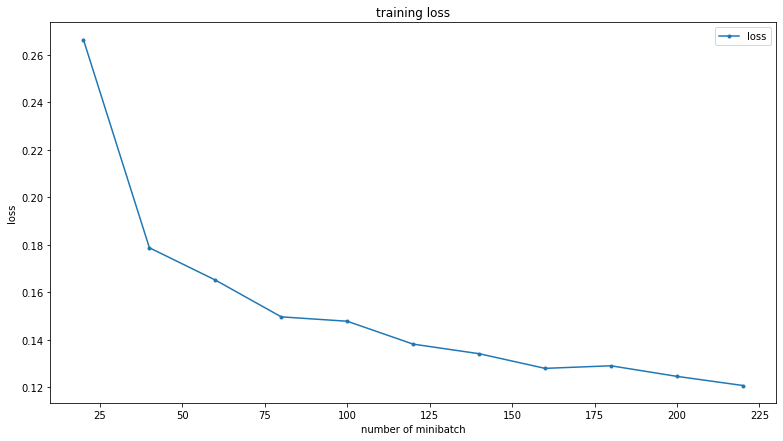

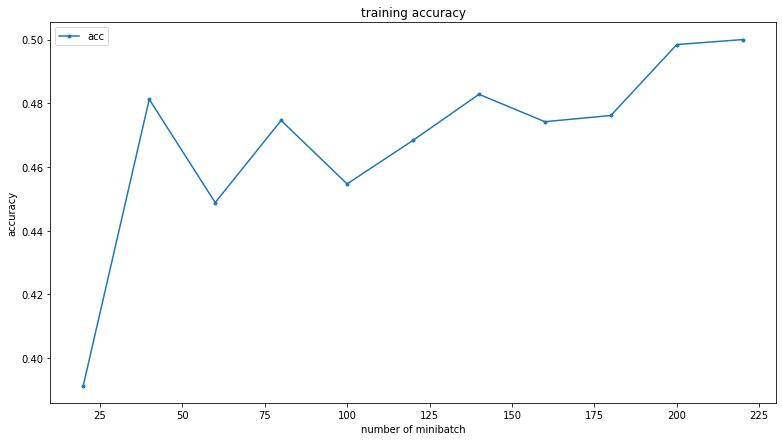

In [33]:
%%time

import torch.optim as optim
from torch.optim import lr_scheduler

# Send the model to GPU
model = model.cuda()

# Observe that all parameters are being optimized
optimizer = optim.Adam(params_to_update, lr=0.001)

# specify loss function (categorical cross-entropy)
criterion = nn.BCELoss()

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)


# number of epochs to train the model
loss_log_1 = {}
acc_log_1 = {}
batch_num = 0
for epoch in range(1, epoch_test+1):
    exp_lr_scheduler.step()
    # keep track of training and validation loss
    train_loss = 0.0
    train_acc=0.0
    ###################
    # train the model #
    ###################
    # model by default is set to train
    for batch_i, (data, target) in enumerate(train_loader):
        
        model.train()
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        
        #!!! the out without sigmoid is even better!!! 
        preds_sig = torch.sigmoid(output) #!!!!!!!!!!!!!!!!!!!!!!!! 
        loss = criterion(preds_sig, target)
        
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss 
        train_loss += loss.item()
        
        model.eval()
        preds= torch.round(preds_sig).detach().cpu().numpy()
        target = target.cpu().numpy()    
        
        correct = sum([str(preds[i]) == str(target[i]) for i in range(len(target))])
        train_acc += correct/len(target)
        
        
        if batch_i % 20 == 19:    # print training loss every specified number of mini-batches
            #print('Epoch %d, Batch %d loss: %.16f' %(epoch, batch_i + 1, train_loss / 20))
            print('Epoch %d, Batch %d loss: %.16f,  acc: %.16f' %(epoch, batch_i + 1, train_loss / 20, train_acc / 20))
            batch_num += 20
            loss_log_1[batch_num] = train_loss / 20
            acc_log_1[batch_num] = train_acc / 20
            
            train_loss = 0.0
            train_acc = 0.0

df_loss_plot= pd.DataFrame({'loss':pd.Series(loss_log_1)})
ax = df_loss_plot.plot(title ='training loss',figsize=(13, 7),marker='.')
ax.set_xlabel("number of minibatch")
ax.set_ylabel("loss")

df_acc_plot= pd.DataFrame({'acc':pd.Series(acc_log_1)})
ax = df_acc_plot.plot(title ='training accuracy',figsize=(13, 7),marker='.')
ax.set_xlabel("number of minibatch")
ax.set_ylabel("accuracy")

## Case2:  Freeze all weight and add a few more dense layers on ResNet

### define the model and disable the weights

In [34]:
import torch.nn as nn
# Load the pretrained model from pytorch
model = torchvision.models.resnet18(pretrained=True)
cnt=0

# Freeze training for all "features" layers
for param in model.parameters():
    cnt+=1
print(cnt)

cnt=0
for param in model.parameters():
    if cnt<62:
        param.requires_grad = False
    cnt+=1
    
    
n_inputs = model.fc.in_features
last_layer = nn.Linear(n_inputs, 20)
model.fc = last_layer

model.fc.add_module("0", nn.Dropout(p=0.5, inplace=False))
model.fc.add_module("1", nn.Linear(n_inputs, 256))
model.fc.add_module("2", nn.ReLU(inplace=True))
model.fc.add_module("3", nn.Dropout(p=0.5, inplace=False))
model.fc.add_module("4", nn.Linear(256, 128))
model.fc.add_module("5", nn.ReLU(inplace=True))
model.fc.add_module("6", nn.Linear(128, 20))

# if GPU is available, move the model to GPU
if train_on_gpu:
    model.cuda()

# check to see that your last layer produces the expected number of outputs
print(model.fc)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model.parameters()
print("Params to learn:")

feature_extract = True
if feature_extract:
    params_to_update = []
    for name,param in model.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model.named_parameters():
        if param.requires_grad == True:
            print("\t",name)


62
Linear(
  in_features=512, out_features=20, bias=True
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=512, out_features=256, bias=True)
  (2): ReLU(inplace=True)
  (3): Dropout(p=0.5, inplace=False)
  (4): Linear(in_features=256, out_features=128, bias=True)
  (5): ReLU(inplace=True)
  (6): Linear(in_features=128, out_features=20, bias=True)
)
Params to learn:
	 fc.weight
	 fc.bias
	 fc.1.weight
	 fc.1.bias
	 fc.4.weight
	 fc.4.bias
	 fc.6.weight
	 fc.6.bias


### train the model and plot the loss & accuracy

C:\Users\ANPC\Anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:122: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


Epoch 1, Batch 20 loss: 0.2668537877500057,  acc: 0.3855468750000000
Epoch 1, Batch 40 loss: 0.1830647431313991,  acc: 0.4640625000000000
Epoch 1, Batch 60 loss: 0.1605344615876675,  acc: 0.4742187500000000
Epoch 1, Batch 80 loss: 0.1548452079296112,  acc: 0.4593750000000000
Epoch 1, Batch 100 loss: 0.1438017334789038,  acc: 0.4726562500000000
Epoch 1, Batch 120 loss: 0.1387171410024166,  acc: 0.4648437500000000
Epoch 1, Batch 140 loss: 0.1364032108336687,  acc: 0.4664062500000000
Epoch 1, Batch 160 loss: 0.1317279808223248,  acc: 0.4714843750000000
Epoch 1, Batch 180 loss: 0.1298203531652689,  acc: 0.4804687500000000
Epoch 1, Batch 200 loss: 0.1235905919224024,  acc: 0.5027343750000000
Epoch 1, Batch 220 loss: 0.1189444024115801,  acc: 0.5144531250000000
Wall time: 2min 31s


Text(0, 0.5, 'accuracy')

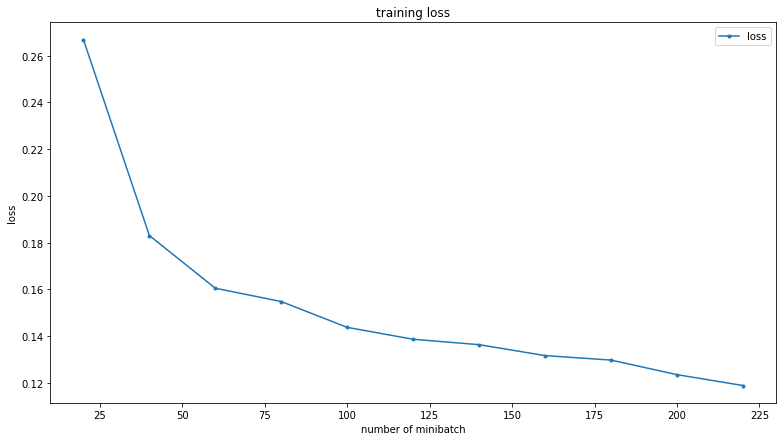

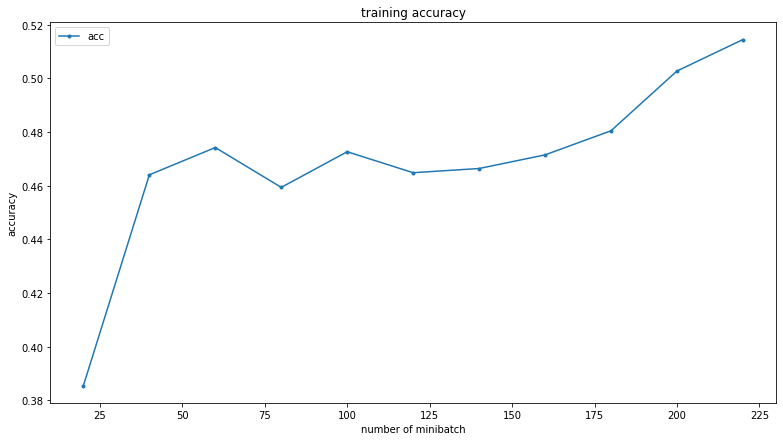

In [35]:
%%time

import torch.optim as optim
from torch.optim import lr_scheduler

# Send the model to GPU
model = model.cuda()

# Observe that all parameters are being optimized
optimizer = optim.Adam(params_to_update, lr=0.001)

# specify loss function (categorical cross-entropy)
criterion = nn.BCELoss()

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)


# number of epochs to train the model
loss_log_1 = {}
acc_log_1 = {}
batch_num = 0
for epoch in range(1, epoch_test+1):
    exp_lr_scheduler.step()
    # keep track of training and validation loss
    train_loss = 0.0
    train_acc=0.0
    ###################
    # train the model #
    ###################
    # model by default is set to train
    for batch_i, (data, target) in enumerate(train_loader):
        
        model.train()
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        
        #!!! the out without sigmoid is even better!!! 
        preds_sig = torch.sigmoid(output) #!!!!!!!!!!!!!!!!!!!!!!!! 
        loss = criterion(preds_sig, target)
        
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss 
        train_loss += loss.item()
        
        model.eval()
        preds= torch.round(preds_sig).detach().cpu().numpy()
        target = target.cpu().numpy()    
        
        correct = sum([str(preds[i]) == str(target[i]) for i in range(len(target))])
        train_acc += correct/len(target)
        
        
        if batch_i % 20 == 19:    # print training loss every specified number of mini-batches
            #print('Epoch %d, Batch %d loss: %.16f' %(epoch, batch_i + 1, train_loss / 20))
            print('Epoch %d, Batch %d loss: %.16f,  acc: %.16f' %(epoch, batch_i + 1, train_loss / 20, train_acc / 20))
            batch_num += 20
            loss_log_1[batch_num] = train_loss / 20
            acc_log_1[batch_num] = train_acc / 20
            
            train_loss = 0.0
            train_acc = 0.0

df_loss_plot= pd.DataFrame({'loss':pd.Series(loss_log_1)})
ax = df_loss_plot.plot(title ='training loss',figsize=(13, 7),marker='.')
ax.set_xlabel("number of minibatch")
ax.set_ylabel("loss")

df_acc_plot= pd.DataFrame({'acc':pd.Series(acc_log_1)})
ax = df_acc_plot.plot(title ='training accuracy',figsize=(13, 7),marker='.')
ax.set_xlabel("number of minibatch")
ax.set_ylabel("accuracy")

## Case3: only updating the last 2 conv layers set and last output layer 

### define the model and disable the weights

In [36]:
import torch.nn as nn
# Load the pretrained model from pytorch
model = torchvision.models.resnet18(pretrained=True)
cnt=0

# Freeze training for all "features" layers
for param in model.parameters():
    cnt+=1
print(cnt)

cnt=0
for param in model.parameters():
    if cnt<54:
        param.requires_grad = False
    cnt+=1
    
    
n_inputs = model.fc.in_features
last_layer = nn.Linear(n_inputs, 20)
model.fc = last_layer

# if GPU is available, move the model to GPU
if train_on_gpu:
    model.cuda()

# check to see that your last layer produces the expected number of outputs
print(model.fc)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model.parameters()
print("Params to learn:")

feature_extract = True
if feature_extract:
    params_to_update = []
    for name,param in model.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model.named_parameters():
        if param.requires_grad == True:
            print("\t",name)


62
Linear(in_features=512, out_features=20, bias=True)
Params to learn:
	 layer4.1.conv1.weight
	 layer4.1.bn1.weight
	 layer4.1.bn1.bias
	 layer4.1.conv2.weight
	 layer4.1.bn2.weight
	 layer4.1.bn2.bias
	 fc.weight
	 fc.bias


### train the model and plot the loss & accuracy

C:\Users\ANPC\Anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:122: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


Epoch 1, Batch 20 loss: 0.2001202885061502,  acc: 0.4347656250000000
Epoch 1, Batch 40 loss: 0.1108765713870525,  acc: 0.5398437500000000
Epoch 1, Batch 60 loss: 0.1047377604991198,  acc: 0.5429687500000000
Epoch 1, Batch 80 loss: 0.0977083168923855,  acc: 0.5781250000000000
Epoch 1, Batch 100 loss: 0.1012543506920338,  acc: 0.5566406250000000
Epoch 1, Batch 120 loss: 0.0989028457552195,  acc: 0.5671875000000000
Epoch 1, Batch 140 loss: 0.0988191697746515,  acc: 0.5707031250000000
Epoch 1, Batch 160 loss: 0.0924604352563620,  acc: 0.5824218750000000
Epoch 1, Batch 180 loss: 0.0951907899230719,  acc: 0.5765625000000000
Epoch 1, Batch 200 loss: 0.0963244155049324,  acc: 0.5804687500000000
Epoch 1, Batch 220 loss: 0.0972987953573465,  acc: 0.5648437500000000
Wall time: 2min 37s


Text(0, 0.5, 'accuracy')

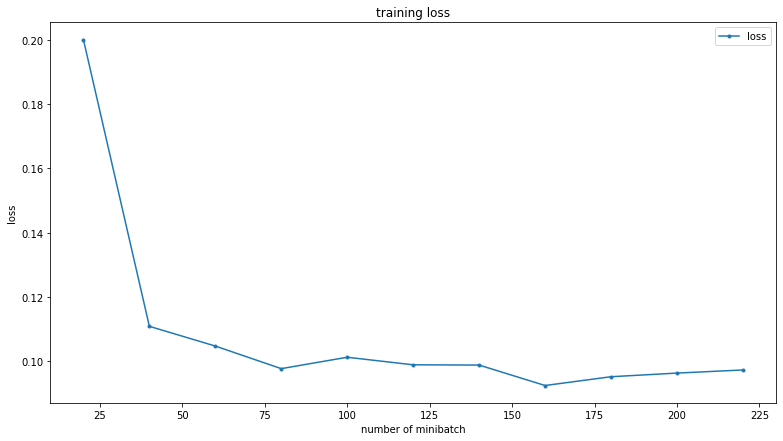

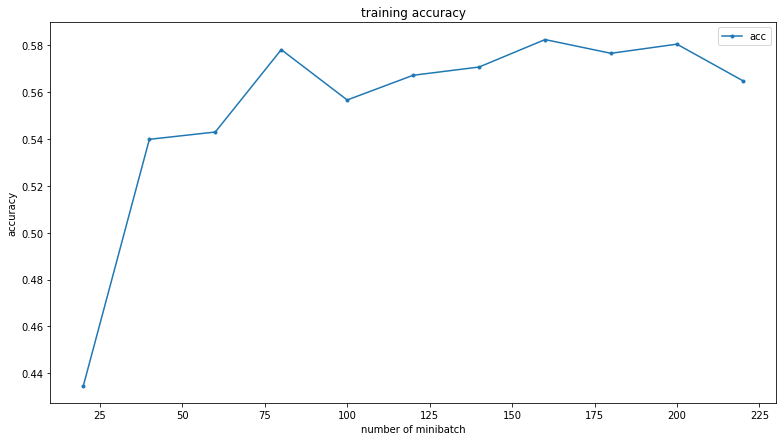

In [37]:
%%time

import torch.optim as optim
from torch.optim import lr_scheduler

# Send the model to GPU
model = model.cuda()

# Observe that all parameters are being optimized
optimizer = optim.Adam(params_to_update, lr=0.001)

# specify loss function (categorical cross-entropy)
criterion = nn.BCELoss()

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)


# number of epochs to train the model
loss_log_1 = {}
acc_log_1 = {}
batch_num = 0
for epoch in range(1, epoch_test+1):
    exp_lr_scheduler.step()
    # keep track of training and validation loss
    train_loss = 0.0
    train_acc=0.0
    ###################
    # train the model #
    ###################
    # model by default is set to train
    for batch_i, (data, target) in enumerate(train_loader):
        
        model.train()
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        
        #!!! the out without sigmoid is even better!!! 
        preds_sig = torch.sigmoid(output) #!!!!!!!!!!!!!!!!!!!!!!!! 
        loss = criterion(preds_sig, target)
        
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss 
        train_loss += loss.item()
        
        model.eval()
        preds= torch.round(preds_sig).detach().cpu().numpy()
        target = target.cpu().numpy()    
        
        correct = sum([str(preds[i]) == str(target[i]) for i in range(len(target))])
        train_acc += correct/len(target)
        
        
        if batch_i % 20 == 19:    # print training loss every specified number of mini-batches
            #print('Epoch %d, Batch %d loss: %.16f' %(epoch, batch_i + 1, train_loss / 20))
            print('Epoch %d, Batch %d loss: %.16f,  acc: %.16f' %(epoch, batch_i + 1, train_loss / 20, train_acc / 20))
            batch_num += 20
            loss_log_1[batch_num] = train_loss / 20
            acc_log_1[batch_num] = train_acc / 20
            
            train_loss = 0.0
            train_acc = 0.0

df_loss_plot= pd.DataFrame({'loss':pd.Series(loss_log_1)})
ax = df_loss_plot.plot(title ='training loss',figsize=(13, 7),marker='.')
ax.set_xlabel("number of minibatch")
ax.set_ylabel("loss")

df_acc_plot= pd.DataFrame({'acc':pd.Series(acc_log_1)})
ax = df_acc_plot.plot(title ='training accuracy',figsize=(13, 7),marker='.')
ax.set_xlabel("number of minibatch")
ax.set_ylabel("accuracy")

# Section 3 : Language Model for caption 
### (after running this and generate the labels, you need to restart notebook if you want to run the image model again)

### load pretrained glove-twitter-25 as the word embedding model

In [10]:
import gensim.downloader as api
import numpy as np
word_emb_model = api.load("glove-twitter-25") 

### load the data

In [11]:
import os
pathParent = os.path.abspath('..')
import pandas as pd
filepathtn= fr'{pathParent}/Input/train.csv'
filepathtt= fr'{pathParent}/Input/test.csv'

df_train_all= pd.read_csv(filepathtn, usecols=[0,1,2])
df_test_all= pd.read_csv(filepathtt, usecols=[0,1])

df_train_cap = df_train_all[['Caption']].astype(str)
df_test_cap = df_test_all[['Caption']].astype(str)

df_train =df_train_all[['ImageID','Labels']]
df_test =df_test_all[['ImageID']]

df_cap = pd.concat([df_train_cap, df_test_cap], axis=0)
df_cap = df_cap.reset_index()
df_cap


,index,Caption
0,0,Woman in swim suit holding parasol on sunny day.
1,1,A couple of men riding horses on top of a gree...
2,2,They are brave for riding in the jungle on tho...
3,3,a black and silver clock tower at an intersect...
4,4,A train coming to a stop on the tracks out side.
...,...,...
39995,9995,A group of men riding surfboards riding a mass...
39996,9996,A motorcycle parked next to a car in a parking...
39997,9997,a little boy that is playing with a wii
39998,9998,group of kids play Frisbee golf in the middle ...


### text processing - lower case , remove punctuation, remove stop words, tokenization and lemmatization

In [12]:
import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

stemmer = SnowballStemmer("english")
stop = stopwords.words('english')
w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()
def lemmatize_text(text):
    return [lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(text)]

def transform_text(series):
    
    series = series.str.replace('[^\w\s]','')
    series = series.str.lower()
    series = series.apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
    series = series.replace('\d+', '', regex=True)
    #df['tokenized_Caption'] = df.apply(lambda row: nltk.word_tokenize(row['tokenized_Caption']), axis=1)
    series = series.apply(lemmatize_text)
    #df['tokenized_Caption'] = df['tokenized_Caption'].apply(lambda x: [stemmer.stem(y) for y in x]) # Stem every word.
    return series

df_cap['tokenized_Caption'] = transform_text(df_cap['Caption'])
df_cap

,index,Caption,tokenized_Caption
0,0,Woman in swim suit holding parasol on sunny day.,"[woman, swim, suit, holding, parasol, sunny, day]"
1,1,A couple of men riding horses on top of a gree...,"[couple, men, riding, horse, top, green, field]"
2,2,They are brave for riding in the jungle on tho...,"[brave, riding, jungle, elephant]"
3,3,a black and silver clock tower at an intersect...,"[black, silver, clock, tower, intersection, ne..."
4,4,A train coming to a stop on the tracks out side.,"[train, coming, stop, track, side]"
...,...,...,...
39995,9995,A group of men riding surfboards riding a mass...,"[group, men, riding, surfboard, riding, massiv..."
39996,9996,A motorcycle parked next to a car in a parking...,"[motorcycle, parked, next, car, parking, lot]"
39997,9997,a little boy that is playing with a wii,"[little, boy, playing, wii]"
39998,9998,group of kids play Frisbee golf in the middle ...,"[group, kid, play, frisbee, golf, middle, wood]"


In [13]:
# find out the maximun number of words in one caption
max_sent= 0
for i in range(len(df_cap['tokenized_Caption'])):
    if len(df_cap['tokenized_Caption'].values[i]) > max_sent:
        max_sent = len(df_cap['tokenized_Caption'].values[i])
print(max_sent)


28


### transform caption words to word vectors

In [14]:
def word_vectors(series, numvec=28):
    vectors = []
    for words in series:
        vectors.append([])
        for word in words:
            try:
                vectors[-1].append(word_emb_model[word])
            except:
                vectors[-1].append(word_emb_model['nan'])
        
        needword = numvec - len(vectors[-1])
        #print(needword)
        for i in range(needword):
            vectors[-1].append(word_emb_model['nan'])
                     
    return vectors
df_cap['word_vectors'] = word_vectors(df_cap['tokenized_Caption'])
df_train_word2vec = df_cap[0:len(df_train_all)] #<- word vector for train
df_test_word2vec = df_cap[len(df_train_all):]# <- word vector for test

df_cap.head()

,index,Caption,tokenized_Caption,word_vectors
0,0,Woman in swim suit holding parasol on sunny day.,"[woman, swim, suit, holding, parasol, sunny, day]","[[-0.92527, -0.33879, -0.32138, 0.14676, 0.522..."
1,1,A couple of men riding horses on top of a gree...,"[couple, men, riding, horse, top, green, field]","[[-0.1313, 0.11837, 0.10646, 0.19, 0.28826, 0...."
2,2,They are brave for riding in the jungle on tho...,"[brave, riding, jungle, elephant]","[[-0.69825, -0.086466, -0.3894, 0.31943, -0.16..."
3,3,a black and silver clock tower at an intersect...,"[black, silver, clock, tower, intersection, ne...","[[-0.012769, -0.94278, 0.33945, -0.37892, 0.72..."
4,4,A train coming to a stop on the tracks out side.,"[train, coming, stop, track, side]","[[-0.99887, 0.44495, -0.90842, -0.18867, -0.64..."


### transform labels to one hot

In [15]:
df_train_word2vec['Labels_list'] = df_train['Labels'].str.rsplit()

#for i in range(1,len(df_train_word2vec)):
one_hot_labels= []

for i in range(len(df_train_word2vec)):
    labels = df_train_word2vec['Labels_list'][i]
    one_hot_labels.append(np.zeros(20))
    #print(labels)
    for label in labels:
        label = int(label)-1  
        one_hot_labels[-1][label]=1
        
df_train_word2vec['labels_onehot'] = one_hot_labels    
df_train_word2vec[['Labels_list','labels_onehot']]

#give dummy onehot labels to test set
df_test_word2vec['labels_onehot']= one_hot_labels[0:len(df_test_word2vec)]
df_test_word2vec

C:\Users\ANPC\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\ANPC\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\ANPC\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

,index,Caption,tokenized_Caption,word_vectors,labels_onehot
30000,0,A little girl waring a krispy kreme hat holdin...,"[little, girl, waring, krispy, kreme, hat, hol...","[[-0.82492, -0.38849, 0.51727, 0.68471, 0.3714...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
30001,1,A beautiful young woman holding an orange fris...,"[beautiful, young, woman, holding, orange, fri...","[[-1.5578, -0.99442, 0.30093, 0.055712, 0.0960...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
30002,2,A group of people sitting on couch next to a c...,"[group, people, sitting, couch, next, coffee, ...","[[0.11129, 0.6306, -0.074805, -1.1556, 0.78955...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
30003,3,A person on a snowboard rides on the hill.,"[person, snowboard, ride, hill]","[[-0.079901, -0.091993, -0.46233, 0.29856, 0.7...","[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ..."
30004,4,A man riding a skateboard with a helmet on in ...,"[man, riding, skateboard, helmet, cone]","[[0.37013, -0.39648, -0.021712, -0.6301, -0.31...","[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, ..."
...,...,...,...,...,...
39995,9995,A group of men riding surfboards riding a mass...,"[group, men, riding, surfboard, riding, massiv...","[[0.11129, 0.6306, -0.074805, -1.1556, 0.78955...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
39996,9996,A motorcycle parked next to a car in a parking...,"[motorcycle, parked, next, car, parking, lot]","[[-1.1385, -0.16748, 0.26216, -1.1043, 0.62963...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
39997,9997,a little boy that is playing with a wii,"[little, boy, playing, wii]","[[-0.82492, -0.38849, 0.51727, 0.68471, 0.3714...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
39998,9998,group of kids play Frisbee golf in the middle ...,"[group, kid, play, frisbee, golf, middle, wood]","[[0.11129, 0.6306, -0.074805, -1.1556, 0.78955...","[1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, ..."


### process word vectors and one hot labels, put them into Dataloader

In [16]:
#More detailed info about the TensorDataset, https://pytorch.org/docs/1.1.0/_modules/torch/utils/data/dataset.html#TensorDataset
train_sentences_X = df_train_word2vec['word_vectors'].values
train_tags_y =  df_train_word2vec['labels_onehot'].values

new_train_sentences_X = [torch.from_numpy(np.array(l)) for l in train_sentences_X ]
new_train_tags_y = [torch.from_numpy(np.array(l)) for l in train_tags_y]

new_train_sentences_X = torch.stack(new_train_sentences_X)
new_train_tags_y = torch.stack(new_train_tags_y)


batch_size = 128
from torch.utils.data import TensorDataset
train_data = TensorDataset(new_train_sentences_X, new_train_tags_y)

#More detailed info about the dataLoader, https://pytorch.org/docs/1.1.0/_modules/torch/utils/data/dataloader.html
from torch.utils.data import DataLoader
train_loader_nlp = DataLoader(dataset=train_data, batch_size=batch_size, shuffle=False)

In [17]:
#More detailed info about the TensorDataset, https://pytorch.org/docs/1.1.0/_modules/torch/utils/data/dataset.html#TensorDataset
test_sentences_X = df_test_word2vec['word_vectors'].values
test_tags_y =  df_test_word2vec['labels_onehot'].values

new_test_sentences_X = [torch.from_numpy(np.array(l)) for l in test_sentences_X ]
new_test_tags_y = [torch.from_numpy(np.array(l)) for l in test_tags_y]

new_test_sentences_X = torch.stack(new_test_sentences_X)
new_test_tags_y = torch.stack(new_test_tags_y)


batch_size = 128
from torch.utils.data import TensorDataset
test_data = TensorDataset(new_test_sentences_X, new_test_tags_y)

#More detailed info about the dataLoader, https://pytorch.org/docs/1.1.0/_modules/torch/utils/data/dataloader.html
from torch.utils.data import DataLoader
test_loader_nlp = DataLoader(dataset=test_data, batch_size=batch_size, shuffle=False)

### define LSTM model and start training

In [18]:
%%time
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import accuracy_score

class LSTMTagger(nn.Module):

    def __init__(self, embedding_dim, hidden_dim):
        super(LSTMTagger, self).__init__()
        self.hidden_dim = hidden_dim
        #self.word_embeddings = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim,batch_first=True, bidirectional=True)  
        self.hidden2tag = nn.Linear(hidden_dim * 2, 20)
        self.outlayer = nn.Linear(560, 20)

    def forward(self, sentence):
        #embeds = self.word_embeddings(sentence)
        lstm_out, _ = self.lstm(sentence)
        tag_space = self.hidden2tag(lstm_out) 
        #tag_scores = F.log_softmax(tag_space, dim=-1) 
        flat_out = tag_space.view(tag_space.size(0), -1)
        out =self.outlayer(flat_out)
        return out


EMBEDDING_DIM = 128
HIDDEN_DIM = 256

model_nlp = LSTMTagger(embedding_dim=25, hidden_dim= 128).cuda()
#criterion = nn.NLLLoss()
criterion = nn.BCELoss()
#criterion = nn.BCEWithLogitsLoss()

optimizer = torch.optim.Adam(model_nlp.parameters(), lr=0.001)

loss_log_nlp={}
acc_log_nlp={}

epochs = 150
for epoch in range(epochs):  
    loss_now = 0.0
    acc_epoch =[]
    
    for sentence,targets in train_loader_nlp:
        acc_batch=0
        
        sentence = sentence.cuda()
        targets = targets.float().cuda()

        model_nlp.zero_grad()
        model_nlp.train()       
        tag_scores = model_nlp(sentence)
        preds_sig = torch.sigmoid(tag_scores)

        #print(preds_sig.shape)      
        #print(targets.shape)
        
        loss = criterion(preds_sig, targets)
        #loss = loss_function(tag_scores, targets)
        
        loss.backward()
        optimizer.step()
        
        loss_now+=loss.item()

        model_nlp.eval()
        output = model_nlp(sentence)
        #t = targets.view(-1).cpu().numpy()
        t = targets.cpu().numpy()
        preds_sig = torch.sigmoid(output)
        preds= torch.round(preds_sig).detach().cpu().numpy()
        
        #print(preds[0])
        #print(t[0])
        
        #print(sum(abs(preds[0] -t[0])))
        
        
        for i in range(len(preds)):
            if sum(abs(preds[i] -t[i]))==0:
                acc_batch+=1
                
        #print(acc_batch/len(preds))
        acc_epoch.append(acc_batch/len(preds))

        # Note: The training accuracy here is calculated with "PAD", which means most of pos tag will be "0".
        #acc = acc+accuracy_score(prediction,t)*len(prediction) 
        
    print('Epoch: %d, training loss: %.4f, training acc: %.2f%%'%(epoch+1,loss_now, sum(acc_epoch)/len(acc_epoch) ))
    loss_log_nlp[epoch+1] = loss_now
    acc_log_nlp[epoch+1]  = sum(acc_epoch)/len(acc_epoch)
    


Epoch: 1, training loss: 43.7509, training acc: 0.46%
Epoch: 2, training loss: 33.3882, training acc: 0.47%
Epoch: 3, training loss: 28.5424, training acc: 0.52%
Epoch: 4, training loss: 25.6387, training acc: 0.57%
Epoch: 5, training loss: 23.6258, training acc: 0.60%
Epoch: 6, training loss: 22.2739, training acc: 0.62%
Epoch: 7, training loss: 21.3512, training acc: 0.63%
Epoch: 8, training loss: 20.6100, training acc: 0.64%
Epoch: 9, training loss: 20.0648, training acc: 0.65%
Epoch: 10, training loss: 19.6094, training acc: 0.66%
Epoch: 11, training loss: 19.2080, training acc: 0.66%
Epoch: 12, training loss: 18.8631, training acc: 0.66%
Epoch: 13, training loss: 18.5155, training acc: 0.67%
Epoch: 14, training loss: 18.2138, training acc: 0.67%
Epoch: 15, training loss: 17.9133, training acc: 0.68%
Epoch: 16, training loss: 17.5486, training acc: 0.68%
Epoch: 17, training loss: 17.1924, training acc: 0.68%
Epoch: 18, training loss: 16.9021, training acc: 0.69%
Epoch: 19, training

Epoch: 152, training loss: 1.0893, training acc: 0.99%
Epoch: 153, training loss: 1.0922, training acc: 0.99%
Epoch: 154, training loss: 1.0651, training acc: 0.99%
Epoch: 155, training loss: 1.0642, training acc: 0.99%
Epoch: 156, training loss: 1.1499, training acc: 0.99%
Epoch: 157, training loss: 1.1229, training acc: 0.99%
Epoch: 158, training loss: 1.0851, training acc: 0.99%
Epoch: 159, training loss: 1.1611, training acc: 0.99%
Epoch: 160, training loss: 1.2028, training acc: 0.99%
Epoch: 161, training loss: 1.1157, training acc: 0.99%
Epoch: 162, training loss: 1.2448, training acc: 0.99%
Epoch: 163, training loss: 1.2803, training acc: 0.99%
Epoch: 164, training loss: 1.3224, training acc: 0.99%
Epoch: 165, training loss: 1.1500, training acc: 0.99%
Epoch: 166, training loss: 1.0976, training acc: 0.99%
Epoch: 167, training loss: 1.0389, training acc: 0.99%
Epoch: 168, training loss: 1.0171, training acc: 0.99%
Epoch: 169, training loss: 1.1645, training acc: 0.99%
Epoch: 170

### plot the loss and accuracy

Text(0, 0.5, 'accuracy')

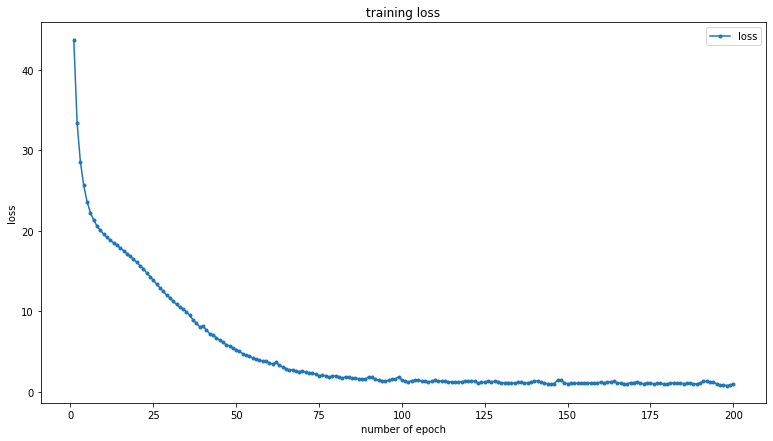

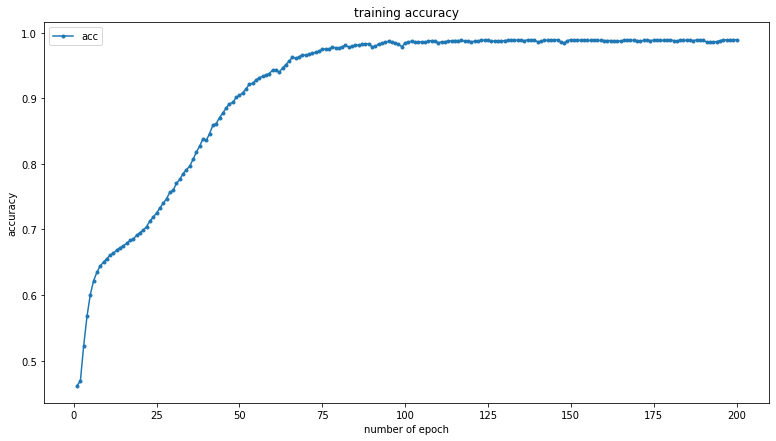

In [19]:
df_loss_plot= pd.DataFrame({'loss':pd.Series(loss_log_nlp)})
ax = df_loss_plot.plot(title ='training loss',figsize=(13, 7),marker='.')
ax.set_xlabel("number of epoch")
ax.set_ylabel("loss")

df_acc_plot= pd.DataFrame({'acc':pd.Series(acc_log_nlp)})
ax = df_acc_plot.plot(title ='training accuracy',figsize=(13, 7),marker='.')
ax.set_xlabel("number of epoch")
ax.set_ylabel("accuracy")

### save the model

In [20]:
torch.save(model_nlp, fr'{pathParent}/Output/5320_A2_nlp.pt')

C:\Users\ANPC\Anaconda3\lib\site-packages\torch\serialization.py:360: UserWarning: Couldn't retrieve source code for container of type LSTMTagger. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


### load the model

In [21]:
class LSTMTagger(nn.Module):

    def __init__(self, embedding_dim, hidden_dim):
        super(LSTMTagger, self).__init__()
        self.hidden_dim = hidden_dim
        #self.word_embeddings = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim,batch_first=True, bidirectional=True)  
        self.hidden2tag = nn.Linear(hidden_dim * 2, 20)
        self.outlayer = nn.Linear(560, 20)

    def forward(self, sentence):
        #embeds = self.word_embeddings(sentence)
        lstm_out, _ = self.lstm(sentence)
        tag_space = self.hidden2tag(lstm_out) 
        #tag_scores = F.log_softmax(tag_space, dim=-1) 
        flat_out = tag_space.view(tag_space.size(0), -1)
        out =self.outlayer(flat_out)
        return out
# Load the pretrained model from pytorch
pathParent = os.path.abspath('..')
#model = torchvision.models.alexnet(pretrained=True)
model_nlp = LSTMTagger(embedding_dim=25, hidden_dim= 128).cuda()

model_nlp = torch.load(fr'{pathParent}/Output/5320_A2_nlp.pt')
model_nlp.eval()

LSTMTagger(
  (lstm): LSTM(25, 128, batch_first=True, bidirectional=True)
  (hidden2tag): Linear(in_features=256, out_features=20, bias=True)
  (outlayer): Linear(in_features=560, out_features=20, bias=True)
)

### use the language model to predict the labels and export a text file in output folder

In [22]:
model_nlp.eval()
preds_alltest = []
for batch_i, (images, target) in enumerate(test_loader_nlp):
    #print(batch_i)
    
    if train_on_gpu:
        images = images.cuda()

    # get sample outputs
    output = model_nlp(images)
    preds_sig = torch.sigmoid(output)
    preds= torch.round(preds_sig).detach().cpu().numpy()    
    preds_alltest.append(preds)
#print(preds_alltest)

preds_alltest_joined= []
for preds in preds_alltest:
    for pred in preds:
        preds_alltest_joined.append(pred)

preds_alltest_joined = preds_alltest_joined[:len(df_test_word2vec)]

labels_out = []
for label in preds_alltest_joined:
    labels_out.append([])
    if sum(label) ==0:
        label[-1] =1
    
    for i in range(len(label)):
        if label[i]==1 : 
            labels_out[-1].append(i+1)
        
len(labels_out)
df_out = df_test[['ImageID']][:]
df_out['Labels'] = labels_out
df_out['Labels'] = df_out['Labels'].astype(str)
df_out['Labels'] = df_out['Labels'].str.replace(',','').str.replace('[','').str.replace(']','')
df_out.tail(20)
lable_out_dir =  fr'{pathParent}/Output/Predicted_labels_nlp.txt'
df_out.to_csv (lable_out_dir, index = False, header=True)
